<a href="https://colab.research.google.com/github/ChetanB1997/Netflix-Movies-and-Tv-Shows-Clustering/blob/main/Unsupervised_learning_Netflix_movies_tvshow_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Netflix Movies and Tv Shows Clustering



##### **Project Type**    - Unsupervised
##### **Team Members 1**    - Chetan Badgujar
##### **Team Members 2**    - Siddharth Patondikar

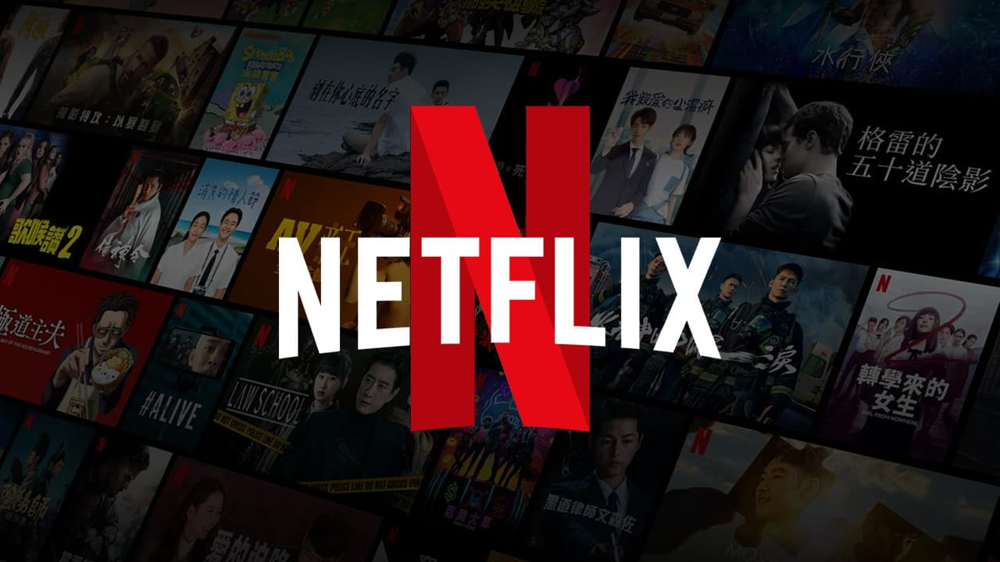

# **Project Summary -**

This project focused on analyzing a dataset of movies and TV shows from Netflix, with the main objective of text-based clustering to group similar content together. The project can be summarized as follows:

After conducting Exploratory Data Analysis (EDA) on the dataset, valuable insights about the content were uncovered. To facilitate clustering, feature engineering was performed, and specific columns, including cast, country, rating, listed_in, and description, were selected for text-based features.

Textual preprocessing involved removing punctuations and stopwords, followed by text-vectorization using the TF-IDF vectorizer, generating 5000 features. To reduce dimensionality and retain meaningful information, Principal Component Analysis (PCA) was applied, resulting in 3000 features explaining 80% of the variance.

Two clustering models, K-Means clustering and Hierarchical clustering, were employed to group the content. For K-Means clustering, the optimal number of clusters (7) was determined using the Elbow Method and Silhouette Analysis. For Hierarchical clustering, dendrogram analysis revealed 8 optimal clusters, and the Agglomerative clustering technique was used.

In conclusion, the Hierarchical Clustering approach yielded the most favorable results, as it effectively differentiated and grouped similar content. The identified clusters can serve as a valuable tool for content organization and recommendation systems, enhancing the overall user experience on the Netflix platform.

# **GitHub Link -**

https://github.com/ChetanB1997/Netflix-Movies-and-Tv-Shows-Clustering

# **Problem Statement**


This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

from wordcloud import WordCloud, STOPWORDS

import warnings
warnings.filterwarnings('ignore')

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Dataset Loading

In [3]:
# Load Dataset
netflix_df = pd.read_csv('/content/drive/MyDrive/AlmaBetter/ML capstone /NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [4]:
# Dataset First Look
netflix_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [5]:
# Dataset Rows & Columns count
print('The dataset has : \n')
print(f'{netflix_df.shape[0]} rows and {netflix_df.shape[1]} columns')

The dataset has : 

7787 rows and 12 columns


In [6]:
# Dataset Info
netflix_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [7]:
# Dataset Duplicate Value Count
netflix_df.duplicated().value_counts()

False    7787
dtype: int64

#### Missing Values/Null Values

In [8]:
# Missing Values/Null Values Count
netflix_df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [9]:
#Percentage of null values per column
round(netflix_df.isnull().sum()*100/len(netflix_df), 2)

show_id          0.00
type             0.00
title            0.00
director        30.68
cast             9.22
country          6.51
date_added       0.13
release_year     0.00
rating           0.09
duration         0.00
listed_in        0.00
description      0.00
dtype: float64

<Axes: >

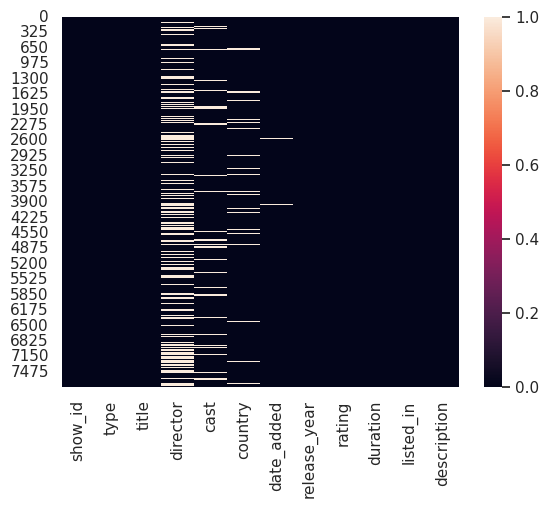

In [10]:
# Visualizing the missing values
sns.heatmap(netflix_df.isnull())

### What did you know about your dataset?

1. There are no duplicate values
2. There are null values in the following columns:
  - director
  - cast
  - country
  - date_added
  - rating

## ***2. Understanding Your Variables***

In [11]:
# Dataset Columns
netflix_df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [12]:
# Dataset Describe
netflix_df.describe(include='object').T  #(transpose)

,count,unique,top,freq
show_id,7787,7787,s1,1
type,7787,2,Movie,5377
title,7787,7787,3%,1
director,5398,4049,"Raúl Campos, Jan Suter",18
cast,7069,6831,David Attenborough,18
country,7280,681,United States,2555
date_added,7777,1565,"January 1, 2020",118
rating,7780,14,TV-MA,2863
duration,7787,216,1 Season,1608
listed_in,7787,492,Documentaries,334


### Variables Description

[link text](https://)show_id : Unique ID for every Movie/Show

* type : Identifier - Movie/Show

* title : Title of the Movie/Show

* director : Director of the Movie/Show

* cast : Actors involved in the Movie/Show

* country : Country where the Movie/Show was produced

* date_added : Date it was added on Netflix

* release_year : Actual Release year of the Movie/Show

* rating : TV Rating of the Movie/Show

* duration : Total Duration - in minutes or number of seasons

* listed_in : Genre

* description : The Summary description

### Check Unique Values for each variable.

In [13]:
# Check Unique Values for each variable.
print('Unique values in each column are : \n')
for col in netflix_df.columns.tolist():
  print(f'{col} : {netflix_df[col].nunique()}')

Unique values in each column are : 

show_id : 7787
type : 2
title : 7787
director : 4049
cast : 6831
country : 681
date_added : 1565
release_year : 73
rating : 14
duration : 216
listed_in : 492
description : 7769


## ***3. Data Visualization***

#### Chart - 1

Text(0.5, 1.0, 'Type Of Content')

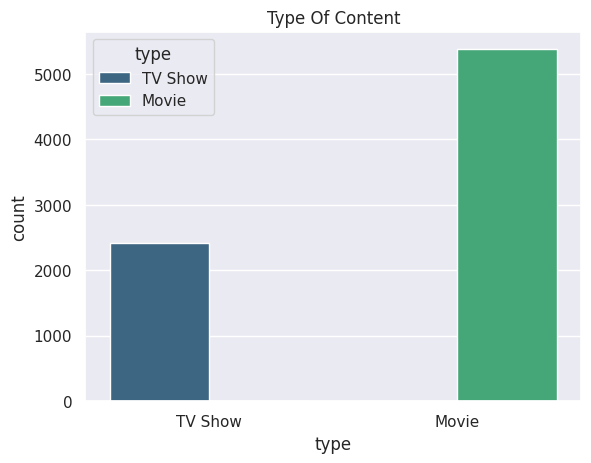

In [14]:
# Type Of Content
sns.countplot(data=netflix_df,x='type',hue='type',palette='viridis')
plt.title('Type Of Content')

##### What is/are the insight(s) found from the chart?

This graph shows the different type of content available on netflix.

In the data we have, more than 5000 movies and around 2400 TV shows.

#### Chart - 2

Text(0.5, 1.0, 'Top 10 directors with most number of Movies')

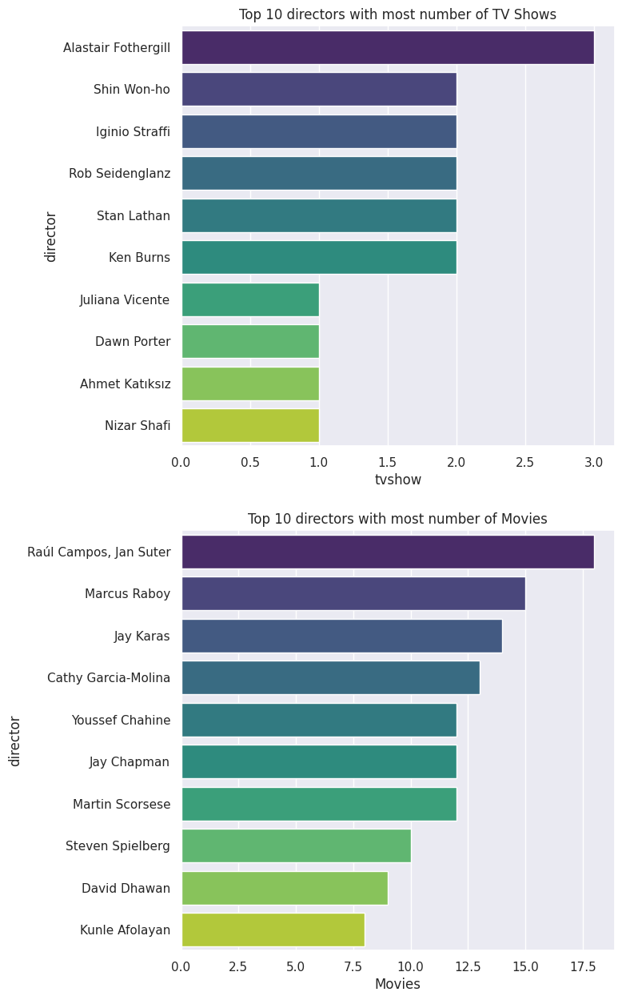

In [15]:
tv_show_dir = pd.DataFrame(netflix_df[netflix_df['type']=='TV Show']['director'].value_counts().sort_values(ascending=False)[0:10]).reset_index()
tv_show_dir.rename(columns={'index':'director','director':'tvshow'},inplace=True)

movie_dir = pd.DataFrame(netflix_df[netflix_df['type']=='Movie']['director'].value_counts().sort_values(ascending=False)[0:10]).reset_index()
movie_dir.rename(columns={'index':'director','director':'Movies'},inplace=True)

# Top 10 directors with most number of movies/tv shows
plt.figure(figsize=(7,15))

plt.subplot(2,1,1)
sns.barplot(data=tv_show_dir,y='director',x='tvshow', palette='viridis')
plt.title('Top 10 directors with most number of TV Shows')

plt.subplot(2,1,2)
sns.barplot(data=movie_dir,y='director',x='Movies', palette='viridis')
plt.title('Top 10 directors with most number of Movies')

##### What is/are the insight(s) found from the chart?

These graphs shows the top 10 directors who have directed the most number of TV Shows and movies.

Alastair Fothergill has directed most number of TV Shows on Netflix that is 3.

Raul Campos and Jan Suter has directed the most number of movies on Netflix that is 18.

#### Chart - 3

In [16]:
tv_show_actor = netflix_df[netflix_df['type']=='TV Show']['cast'].str.split(', ',expand=True).stack()
tv_show_actor = pd.DataFrame(tv_show_actor.value_counts().sort_values(ascending=False)[0:10]).reset_index()
tv_show_actor.rename(columns={'index':'actor',0:'tvshow'},inplace=True)


movie_actor = netflix_df[netflix_df['type']=='Movie']['cast'].str.split(', ',expand=True).stack()
movie_actor = pd.DataFrame(movie_actor.value_counts().sort_values(ascending=False)[0:10]).reset_index()
movie_actor.rename(columns={'index':'actor',0:'movies'},inplace=True)

Text(0.5, 1.0, 'Top 10 actors with most number of Movies')

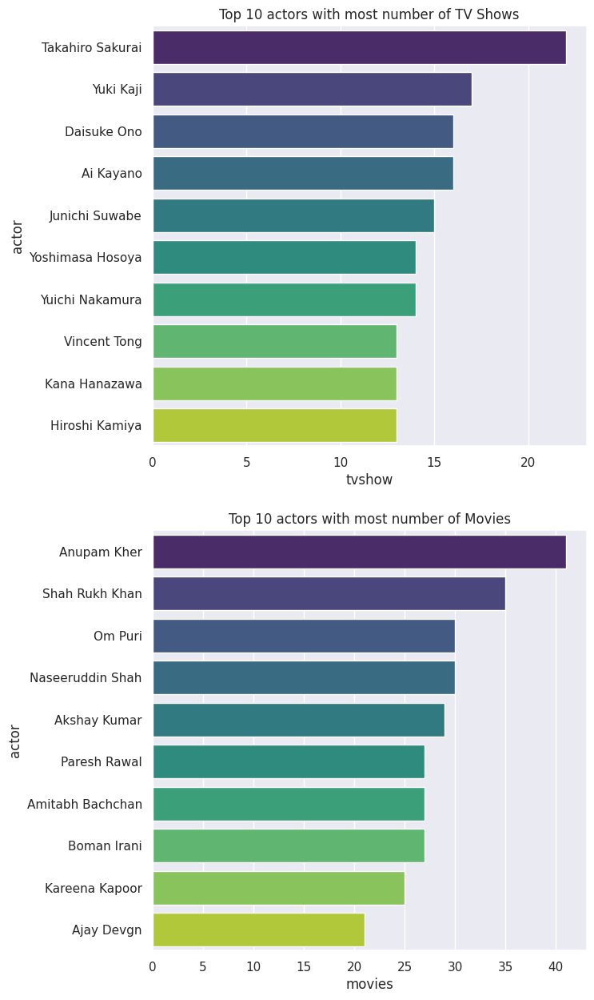

In [17]:
# Top 10 actors with most number of TV Shows/Movies on Netflix
plt.figure(figsize=(7,15))

plt.subplot(2,1,1)
sns.barplot(data=tv_show_actor,y='actor',x='tvshow', palette='viridis')
plt.title('Top 10 actors with most number of TV Shows')

plt.subplot(2,1,2)
sns.barplot(data=movie_actor,y='actor',x='movies', palette='viridis')
plt.title('Top 10 actors with most number of Movies')

##### What is/are the insight(s) found from the chart?

These graphs shows the top 10 actors who have the most number of TV Shows and movies on Netflix.

Takahiro Sakurai has acted in the most number of TV Shows on Netflix that is 22.

Anupam Kher has acted in the most number of movies on Netflix that is 41.

#### Chart - 4

In [18]:
top_countries = pd.DataFrame(netflix_df['country'].value_counts().sort_values(ascending=False)[0:10]).reset_index()
top_countries.rename(columns={'index':'country','country':'total_content'},inplace=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'United States'),
  Text(1, 0, 'India'),
  Text(2, 0, 'United Kingdom'),
  Text(3, 0, 'Japan'),
  Text(4, 0, 'South Korea'),
  Text(5, 0, 'Canada'),
  Text(6, 0, 'Spain'),
  Text(7, 0, 'France'),
  Text(8, 0, 'Egypt'),
  Text(9, 0, 'Turkey')])

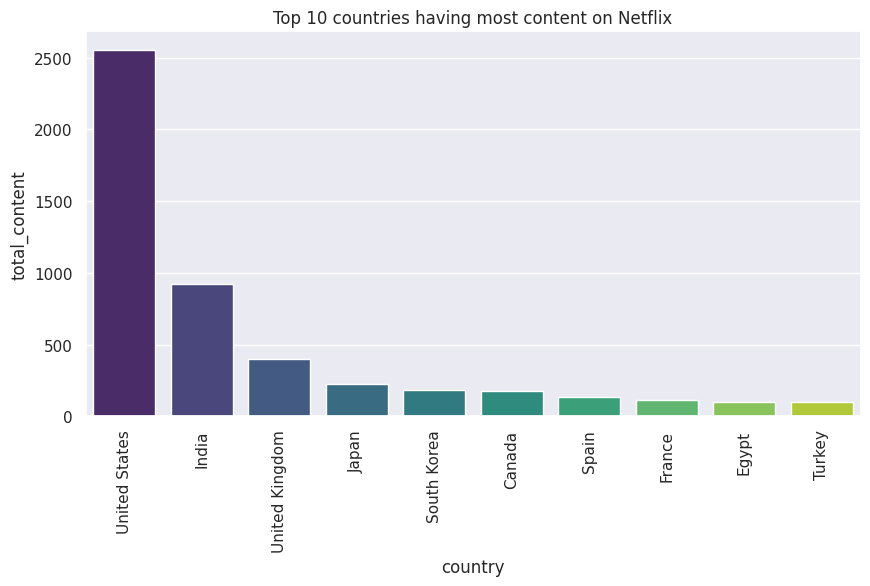

In [19]:
# Top 10 countries having most content
plt.figure(figsize=(10,5))
sns.barplot(data=top_countries,x='country', y='total_content',palette='viridis')
plt.title('Top 10 countries having most content on Netflix')
plt.xticks(rotation=90)

##### 2. What is/are the insight(s) found from the chart?

This graph shows countries which have the most original content on Netflix

United States tops the list with more than 2500 movies and TV shows

#### Chart - 5

Text(0.5, 1.0, 'Top 10 year with most content released')

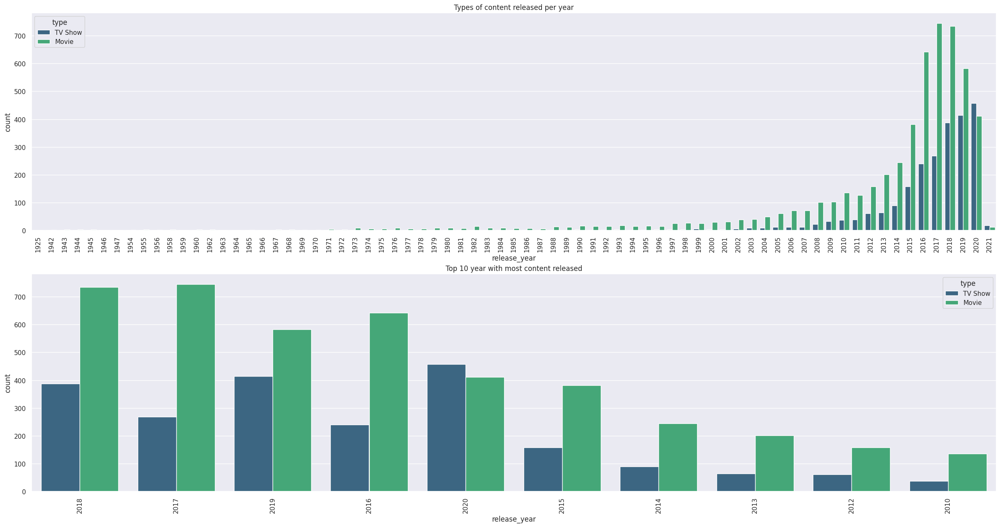

In [20]:
#Distribution of type of content every year
plt.figure(figsize=(30,15))

plt.subplot(2,1,1)
sns.countplot(data=netflix_df, x='release_year',hue='type',palette='viridis')
plt.xticks(rotation=90)
plt.title('Types of content released per year')

plt.subplot(2,1,2)
sns.countplot(data=netflix_df, x='release_year',hue='type',order=netflix_df['release_year'].value_counts().index[0:10], palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 10 year with most content released')

##### 2. What is/are the insight(s) found from the chart?

The two graph shows:
1. Types of content released every year
  - From this we can see that, mostly netflix has content that is released in the 2000s
2. Top 10 years with the most number of total releases
  - From this we can see that highest total content (TV shows + movies) was released in 2018, followed by 2017 and 2019
  - Most number of movies were released in 2017
  - Most number of TV shows were released in 2020

This trend shows that Netlix has been increasingly focusing of TV Shows rather than movies

In [21]:
netflix_df.head(2)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...


#### Chart - 6

Text(0.5, 1.0, 'Distribution of ratings')

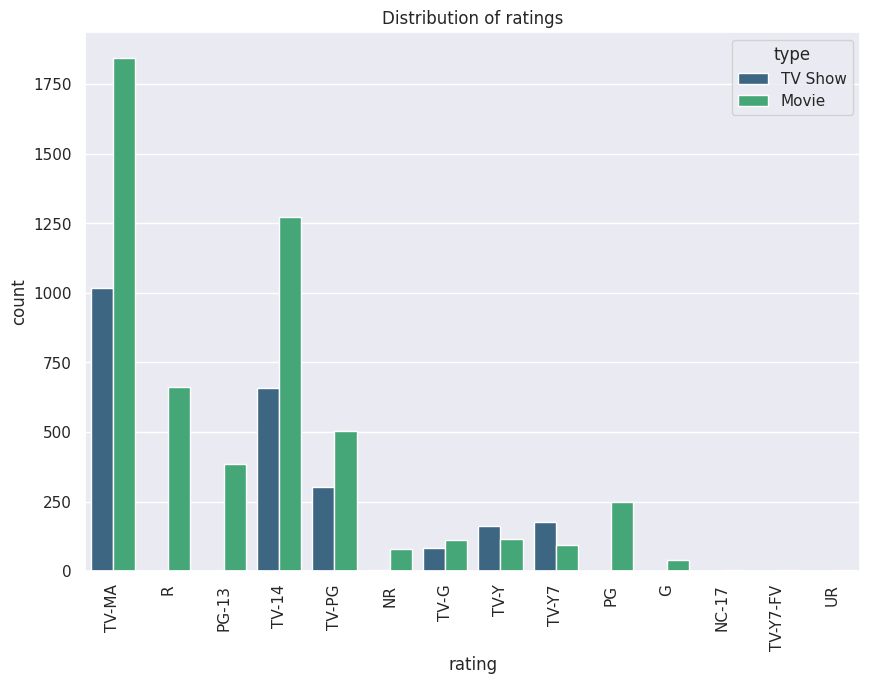

In [22]:
# Distibution of rating
plt.figure(figsize=(10,7))
sns.countplot(data=netflix_df,x='rating',hue='type',palette='viridis')
plt.xticks(rotation=90)
plt.title('Distribution of ratings')

##### What is/are the insight(s) found from the chart?

Genral Description :
  - TV - MA : Mature Audiences Only
  - R - Restricted (18+)
  - PG - 13 : Parents Strongly Cautioned (13+)
  - TV - 14 : For Children 14+ with company of parents
  - TV - PG : Intented for children in the presence of parents
  - NR : Not Rated
  - TV - G : Tv for general audience (everyone included)
  - TV - Y : For children between age 2 and 6
  - PG : Parental guidance suggested
  - G : General (All audience)
  - NC - 17 : Clearly Adult
  - TV - Y7 - FV : Directed to older children (Fantasy Violence)
  - UR : Unrated


- Most number of movies and TV shows are TV-MA rated followed by TV-14, this means most movies and TV shows on netflix are for mature audiences only, this is followed by movies and shows for age 14+.

- There are no shows and only movies R rated category (Restriced : 18+) and PG-13 (13+) category.

- From these stats, it is cleary visible that majority of audience of Netflix is above 18, as most of the shows and movies are catering to that audience.

- Very few to no movies or shows are without ratings.


#### Chart - 7

Text(0.5, 1.0, 'Distibution of ratings in top 10 countries')

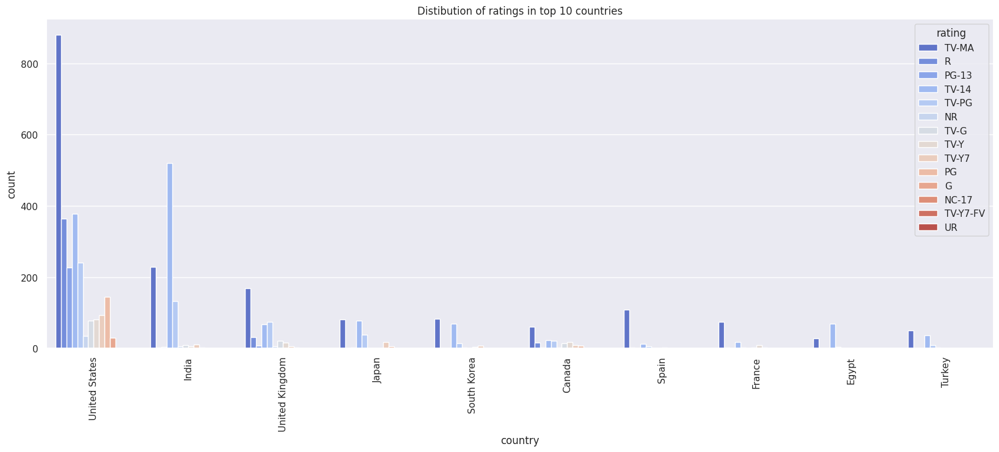

In [23]:
# Distribution of ratings in top 10 country
plt.figure(figsize=(20,7))
sns.countplot(data=netflix_df,x='country',hue='rating', order=netflix_df['country'].value_counts().index[0:10], palette='coolwarm')
plt.xticks(rotation=90)
plt.title('Distibution of ratings in top 10 countries')

##### What is/are the insight(s) found from the chart?

- Most of the cortent originating from top 10 countries on netflix is for mature audiences. The most being in United States with more than 800 movies and shows.
- The exception to above is India and Egypt, where the most content is for 14+ audiences.


#### Chart - 8

In [24]:
# Creating list for length of movies and shows
movie_length = netflix_df[netflix_df['type']=='Movie']['duration'].apply(lambda x: int(x.split(' ')[0]) )

tv_show_length = netflix_df[netflix_df['type']=='TV Show']['duration'].apply(lambda x: int(x.split(' ')[0]) )

Text(0.5, 0, 'Seasons')

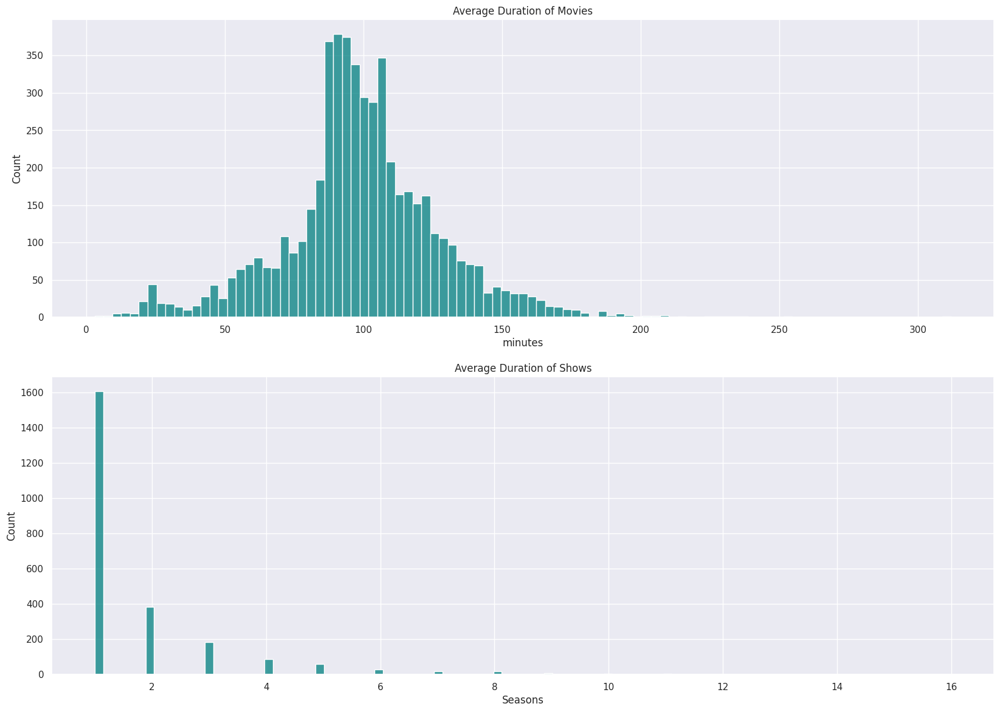

In [25]:
# Length of movies and shows
plt.figure(figsize=(20,14))

plt.subplot(2,1,1)
sns.histplot(list(movie_length),color='teal')
plt.title('Average Duration of Movies')
plt.xlabel('minutes')

plt.subplot(2,1,2)
sns.histplot(list(tv_show_length),color='teal')
plt.title('Average Duration of Shows')
plt.xlabel('Seasons')

##### What is/are the insight(s) found from the chart?

- Most of the movies run for duration of around 100 minutes
- Most of the show run for 1 seasons

#### Chart - 9

In [26]:
#Creating new dataframe for genres
genres = netflix_df['listed_in'].str.split(',',expand=True).stack()
genres = genres.value_counts().reset_index().rename(columns={'index':'genre',0:'total_content'})
genres

,genre,total_content
0,International Movies,2323
1,Dramas,1384
2,Comedies,1074
3,Documentaries,751
4,Dramas,722
...,...,...
68,Romantic Movies,3
69,Spanish-Language TV Shows,2
70,Sports Movies,1
71,TV Sci-Fi & Fantasy,1


Text(0.5, 1.0, 'Bottom 10 genres')

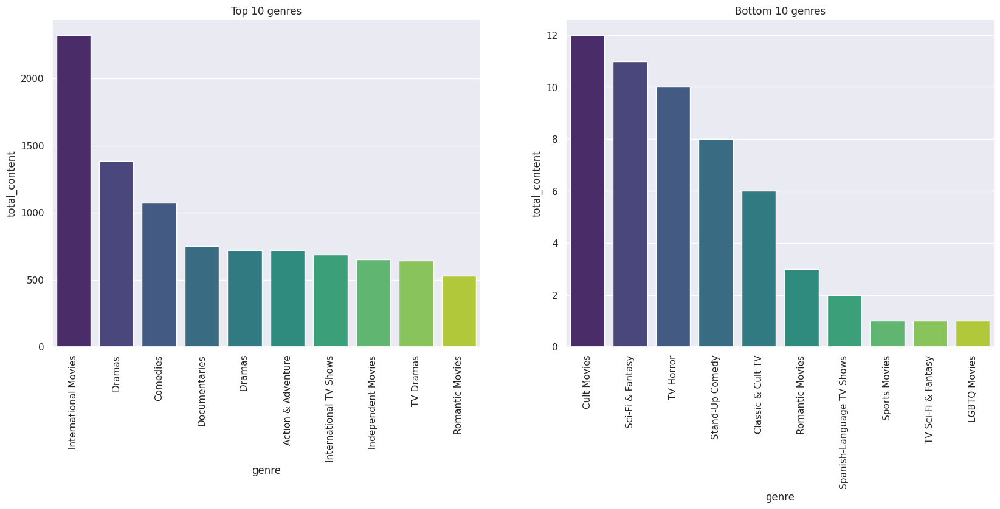

In [27]:
# Top and bottom genres on Netflix
plt.figure(figsize=(20,7))

plt.subplot(1,2,1)
sns.barplot(data=genres.head(10),x='genre',y='total_content',palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 10 genres')

plt.subplot(1,2,2)
sns.barplot(data=genres.tail(10),x='genre',y='total_content', palette='viridis')
plt.xticks(rotation=90)
plt.title('Bottom 10 genres')


##### What is/are the insight(s) found from the chart?

- Top genre on Netflix in International Movies, this basically refers to non-english movies. This is followed by genres Dramas and Comedies.
  - From this we can see that there is huge demand for foreign (non-english) content on Netflix.

- The bottome genre on Neflix is LGBTQ Movies, this is followed by genres such as Sci-Fi Fantasy shows and Sport Movies.

#### Chart - 10

In [28]:
#Creating list of words in description of movies and tv shows for making wordcloud
movies_text = ' '.join(word for word in netflix_df[netflix_df['type']=='Movie']['description'])
tv_show_text = ' '.join(word for word in netflix_df[netflix_df['type']=='TV Show']['description'])

(-0.5, 399.5, 199.5, -0.5)

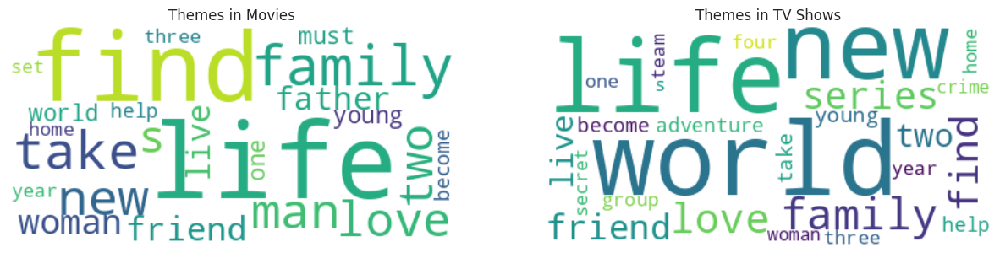

In [29]:
# Themes of Movies and TV Shows

#Creating Word Clouds for Movies and TV Shows
wordcloud_movie = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(movies_text)
wordcloud_show = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(tv_show_text)

plt.figure(figsize=(15,7))

# Themes of Movies and TV Shows
plt.subplot(1,2,1)
plt.imshow(wordcloud_movie, interpolation='bilinear')
plt.title('Themes in Movies')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(wordcloud_show, interpolation='bilinear')
plt.title('Themes in TV Shows')

plt.axis('off')

##### What is/are the insight(s) found from the chart?

- The most used words from description of movies are 'Life','family','find','love'. This means the running theme in most of the movies are about life, love and family.

- The most used words from description of shows are 'world','life','new','family','love'. This means the running theme is most shows is very similar to that in most movies.

#### Chart - 11

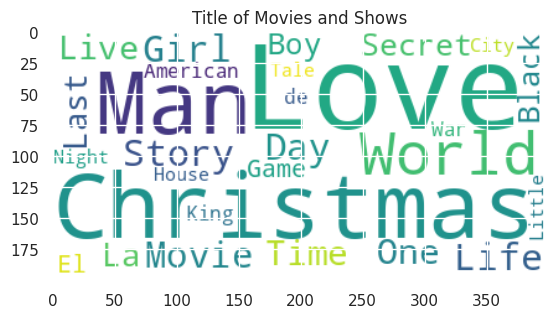

In [30]:
# Title Wordcloud

#Creating a wordcloud for title of shows and movies
title = ' '.join(word for word in netflix_df['title'].tolist())
wordcloud_title = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(title)

#Title Wordcloud
plt.imshow(wordcloud_title,interpolation='bilinear')
plt.title('Title of Movies and Shows')
plt.show()

##### What is/are the insight(s) found from the chart?

- Words like 'Love','Christmas','Man', 'World', 'Life', 'Girl', and 'Story' are frequently used in the movie title column.

#### Chart 12

Text(0.5, 1.0, 'Movies to TV Shows Ratio For Top 10 Countries')

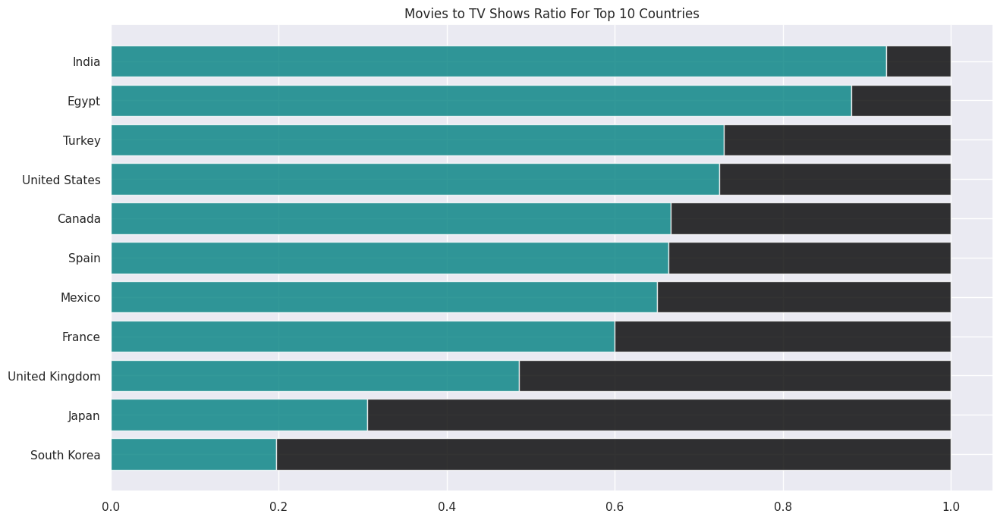

In [31]:
# Plotting the Horizontal bar plot for top 10 country contains Movie & TV Show split
country_order = netflix_df['country'].value_counts()[:11].index
content_data = netflix_df[['type', 'country']].groupby('country')['type'].value_counts().unstack().loc[country_order]
content_data['sum'] = content_data.sum(axis=1)
content_data_ratio = (content_data.T / content_data['sum']).T[['Movie', 'TV Show']].sort_values(by='Movie',ascending=False)[::-1]

# Plotting the barh
fig, ax = plt.subplots(1,1,figsize=(15, 8),)

ax.barh(content_data_ratio.index, content_data_ratio['Movie'],
        color='teal', alpha=0.8, label='Movie')
ax.barh(content_data_ratio.index, content_data_ratio['TV Show'], left=content_data_ratio['Movie'],
        color='black', alpha=0.8, label='TV Show')
plt.title('Movies to TV Shows Ratio For Top 10 Countries')

##### What is/are the insight(s) found from the chart?

- India has highest ratio of movies to shows on Netflix, whereas SouthKorea has highest ratio of shows to movies on Netflix.

#### Chart 13

Text(0.5, 1.0, 'Investment on original content in recent years')

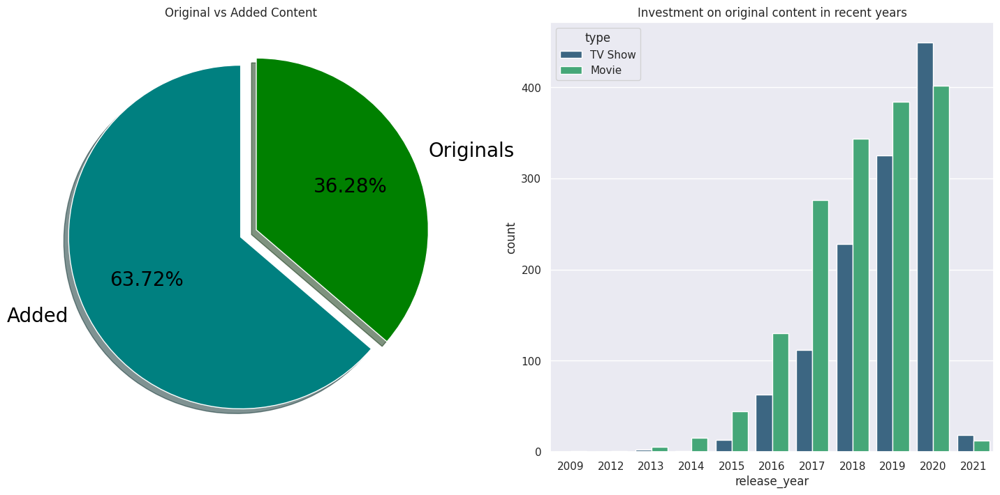

In [32]:
#Creating original vs added content graphs

df = netflix_df.copy()
#Creating a new column for year of date_added
df['year_added'] = pd.to_datetime(df['date_added']).dt.year

#Creating a new column stating whether content is original or not
df['originals'] = np.where(df['release_year'] == df['year_added'], 'Original', 'Added')

explode = (0, 0.1)
color = sns.color_palette('viridis')

plt.figure(figsize=(18,8))

#Plotting Pie chart for Original vs Added
plt.subplot(1,2,1)
plt.pie(df['originals'].value_counts(), explode=explode, autopct='%.2f%%', labels= ['Added', 'Originals'],
       shadow=True, startangle=90,textprops={'color':"black", 'fontsize': 20}, colors =['teal','green'])
plt.title('Original vs Added Content')

df= df[df['originals']=='Original']

#Plotting type of original content
plt.subplot(1,2,2)
# sns.countplot(data=df,x='type',color='teal')
sns.countplot(data=df, x='release_year',hue='type',palette='viridis')
plt.title('Investment on original content in recent years')

##### What is/are the insight(s) found from the chart?

- There is more added content on Netflix than original.
- Netlix started making its own content mainly from 2013.
- Amongst its orginal content, Netflix has been investing more in tv shows than movies in recent years.

## ***4. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

1. R rate movies run for an average duration of 120 mins
2. The top genre is 'Drama'
3. There is more original content on Netflix than added.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (Ho) : Average duration of R rated movies is 120 min,

D = 120

Alternative Hypothesis (Ha) : Average duration of R rate movie is not 120 mins,

 D != 120

#### 2. Perform an appropriate statistical test.

In [33]:
df = netflix_df.copy()
df = df[df['type']=='Movie']
df['runtime'] = df['duration'].apply(lambda x: int(x.split(' ')[0]))

df.groupby('rating')['runtime'].mean()

rating
G            88.076923
NC-17       125.000000
NR           95.443038
PG           98.526316
PG-13       107.772021
R           106.466063
TV-14       110.709119
TV-G         79.927928
TV-MA        95.386450
TV-PG        94.786139
TV-Y         46.538462
TV-Y7        61.684211
TV-Y7-FV     68.400000
UR          106.800000
Name: runtime, dtype: float64

From above we can observe, the average runtime of R rated movies is 106.4 min. Hence we can reject null hypothesis

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (Ho) : The top genre is 'Drama'

Alternative Hypothesis (Ha) : The top genre is not 'Drama'  

#### 2. Perform an appropriate statistical test.

Text(0.5, 1.0, 'Top 10 genres')

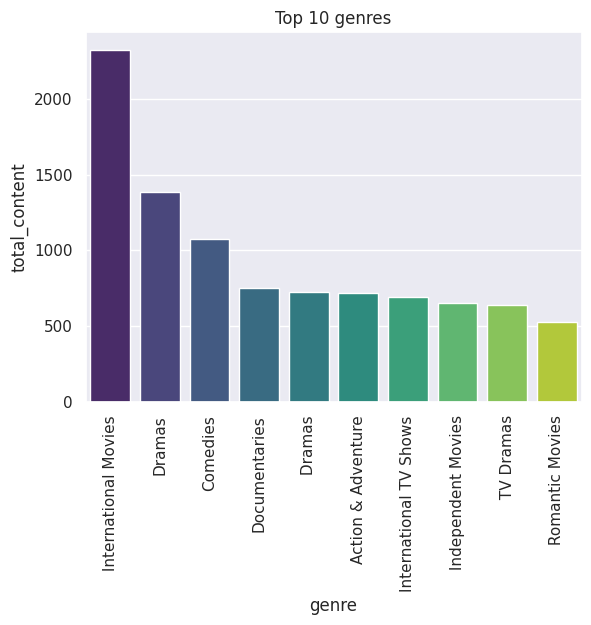

In [34]:
sns.barplot(data=genres.head(10),x='genre',y='total_content',palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 10 genres')

We can see that genre: International Movies has the most content. Hence, we can reject the null hypothesis.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (Ho) : There is more orginal content on Netlfix than added. (No > Na)

Alternative Hypothesis (Ha) : There is less original content on Netflix than added (No < Na)

#### 2. Perform an appropriate statistical test.

([<matplotlib.patches.Wedge at 0x796722bdefe0>,
 [Text(-0.9993681929016183, -0.45963378358923307, 'Added'),
  Text(1.0902198937479648, 0.5014185709326855, 'Originals')],
 [Text(-0.5451099234008826, -0.250709336503218, '63.72%'),
  Text(0.6359616046863127, 0.2924941663773999, '36.28%')])

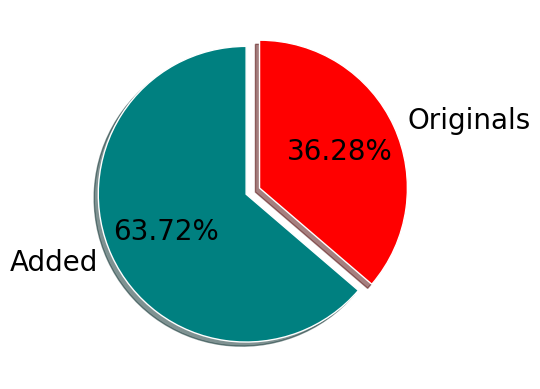

In [35]:
df = netflix_df.copy()
#Creating a new column for year of date_added
df['year_added'] = pd.to_datetime(df['date_added']).dt.year

#Creating a new column stating whether content is original or not
df['originals'] = np.where(df['release_year'] == df['year_added'], 'Original', 'Added')

explode = (0, 0.1)
color = sns.color_palette('viridis')

#Plotting Pie chart for Original vs Added
plt.pie(df['originals'].value_counts(), explode=explode, autopct='%.2f%%', labels= ['Added', 'Originals'],
       shadow=True, startangle=90,textprops={'color':"black", 'fontsize': 20}, colors =['teal','red'])

From above pie chart we can see that No < Na (Added content is more than original). Hence, we can reject null hypothesis

## ***5. Feature Engineering & Data Pre-processing***

### 5.1. Handling Missing Values

In [36]:
netflix_df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

From Here, we will make the following changes to handle null values:
1. Drop the director column
2. Add '' to cast and country columns
3. Drop NA values from date_added and rating columns

In [37]:
# Handling Missing Values & Missing Value Imputation
netflix_df.drop('director',axis=1, inplace=True)

netflix_df['cast'].fillna('')
netflix_df['country'].fillna('')

netflix_df.dropna(inplace=True)

In [38]:
netflix_df.isnull().sum()

show_id         0
type            0
title           0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

### 5.2. Handling Outliers

Text(0.5, 1.0, 'Distribution of release year')

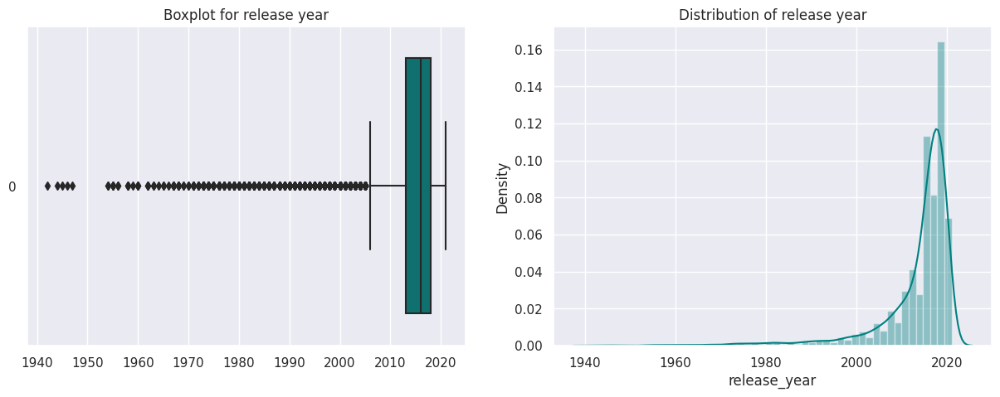

In [39]:
# Handling Outliers & Outlier treatments
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
sns.boxplot(netflix_df['release_year'], orient='h', color='teal')
plt.title('Boxplot for release year')

plt.subplot(1,2,2)
sns.distplot(netflix_df['release_year'], color='teal')
plt.title('Distribution of release year')

Only release_year is our numeric columns, rest all are text based columns. As in our clustering model, we will only feature text based columns, therefore removing outliers on this column is not required as it is not useful for us.

### 5.3. Textual Data Preprocessing


In [40]:
import nltk
import string
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


#### 5.3.1 Attribute Selection

In [41]:
# Creating a new feature combining all text based features
netflix_df['text_data'] = netflix_df['cast'] + netflix_df['country'] + netflix_df['rating'] + netflix_df['listed_in'] + netflix_df['description']
netflix_df.head()

,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,text_data
0,s1,TV Show,3%,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,"João Miguel, Bianca Comparato, Michel Gomes, R..."
1,s2,Movie,7:19,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ..."
2,s3,Movie,23:59,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...","Tedd Chan, Stella Chung, Henley Hii, Lawrence ..."
3,s4,Movie,9,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...","Elijah Wood, John C. Reilly, Jennifer Connelly..."
4,s5,Movie,21,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar..."


In [42]:
#Selecting Random text data
netflix_df['text_data'][3]

'Elijah Wood, John C. Reilly, Jennifer Connelly, Christopher Plummer, Crispin Glover, Martin Landau, Fred Tatasciore, Alan Oppenheimer, Tom KaneUnited StatesPG-13Action & Adventure, Independent Movies, Sci-Fi & FantasyIn a postapocalyptic world, rag-doll robots hide in fear from dangerous machines out to exterminate them, until a brave newcomer joins the group.'

#### 5.3.2. Remove Punctuation +  Lower Casing

In [43]:
# Punctuation
[punc for punc in string.punctuation]

['!',
 '"',
 '#',
 '$',
 '%',
 '&',
 "'",
 '(',
 ')',
 '*',
 '+',
 ',',
 '-',
 '.',
 '/',
 ':',
 ';',
 '<',
 '=',
 '>',
 '?',
 '@',
 '[',
 '\\',
 ']',
 '^',
 '_',
 '`',
 '{',
 '|',
 '}',
 '~']

In [44]:
#Creating a function to remove punctuation and lower case
def remove_punc(text):
  non_punc = [word.lower() for word in text if word.lower() not in string.punctuation]
  return ''.join(non_punc)

In [45]:
#Applying to dataframe
netflix_df['text_data'] = netflix_df['text_data'].apply(remove_punc)

In [46]:
netflix_df['text_data'][3]

'elijah wood john c reilly jennifer connelly christopher plummer crispin glover martin landau fred tatasciore alan oppenheimer tom kaneunited statespg13action  adventure independent movies scifi  fantasyin a postapocalyptic world ragdoll robots hide in fear from dangerous machines out to exterminate them until a brave newcomer joins the group'

#### 5.3.4 Removing Stopwords

In [47]:
# Remove Stopwords
stopwords.words('english')

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [48]:
#Defining function to remove stopwords
def remove_stop(msg):
  data = [word for word in msg.split(' ') if word not in stopwords.words('english')]
  return ' '.join(data)

In [49]:
#Applying to dataframe
netflix_df['text_data'] = netflix_df['text_data'].apply(remove_stop)
netflix_df['text_data'][3]

'elijah wood john c reilly jennifer connelly christopher plummer crispin glover martin landau fred tatasciore alan oppenheimer tom kaneunited statespg13action  adventure independent movies scifi  fantasyin postapocalyptic world ragdoll robots hide fear dangerous machines exterminate brave newcomer joins group'

#### 5.3.5 Stemming

In [50]:
stemmer = SnowballStemmer('english')

#Defining a function to perform stemming
def stem(msg):
  stem = [stemmer.stem(word) for word in msg.split(' ')]
  return ' '.join(stem)

In [51]:
#Applying to dataframe
netflix_df['text_data'] = netflix_df['text_data'].apply(stem)
netflix_df['text_data'][3]

'elijah wood john c reilli jennif connelli christoph plummer crispin glover martin landau fred tatascior alan oppenheim tom kaneunit statespg13act  adventur independ movi scifi  fantasyin postapocalypt world ragdol robot hide fear danger machin extermin brave newcom join group'

#### 5.3.6 Text Vectorization

In [52]:
# Appying TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words='english', lowercase=False, max_features=5000)
X = vectorizer.fit_transform(netflix_df['text_data'])

In [53]:
X.toarray()[3]

array([0., 0., 0., ..., 0., 0., 0.])

In [54]:
print(vectorizer.get_feature_names_out())

['10' '10yearold' '11yearold' ... 'álvaro' 'ángel' 'ángela']


In [55]:
len(vectorizer.get_feature_names_out())

5000

In [56]:
X.toarray().shape

(6643, 5000)

In [57]:
X = X.toarray()

### 5.3.7. Dimesionality Reduction

In [58]:
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(X)

PCA(random_state=42)

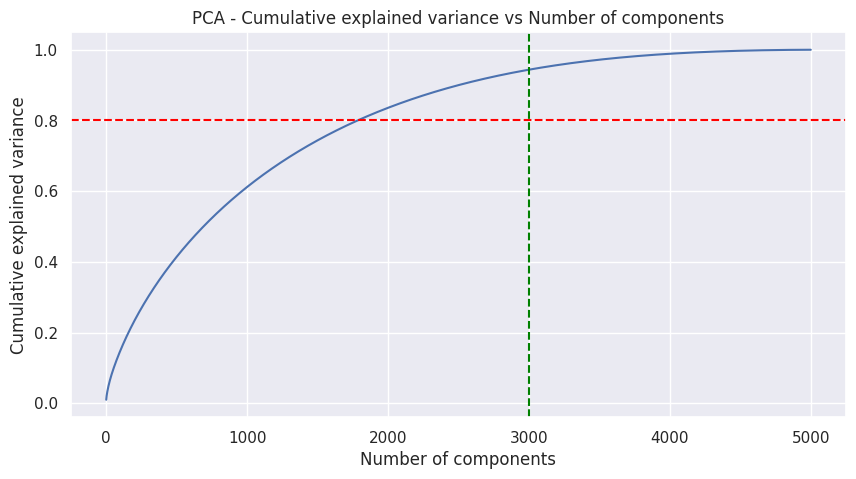

In [59]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

In [60]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(X)

# transformed features
X = pca.transform(X)

# shape of transformed vectors
X.shape

(6643, 3000)

Dimensionality reduction is the process of reducing the number of features in a dataset while preserving as much of the relevant information as possible. It is a technique used to overcome the curse of dimensionality, which refers to the problem of increased computational complexity and decreased performance of machine learning models as the number of features increases.

There are two main types of dimensionality reduction techniques: feature selection and feature extraction.

Feature selection is the process of selecting a subset of the most relevant features from the original feature set. It is a technique that helps to reduce the dimensionality of the data by removing irrelevant and redundant features. Common feature selection techniques include:

Correlation-based feature selection
Mutual information-based feature selection
Recursive feature elimination
SelectKBest
Feature extraction is the process of creating new features from the original feature set by combining or transforming the existing features. It is a technique that helps to reduce the dimensionality of the data by creating a new feature space that is more compact and informative than the original feature space. Common feature extraction techniques include:

Principal Component Analysis (PCA)
Linear Discriminant Analysis (LDA)
Independent Component Analysis (ICA)
Non-Negative Matrix Factorization (NMF)
AutoencoderAnswer Here.

## ***6. ML Model Implementation***

In [61]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

### 6.1 ML Model - K-Means Clustering

### Finding optimal clusters with 'Elbow Method'

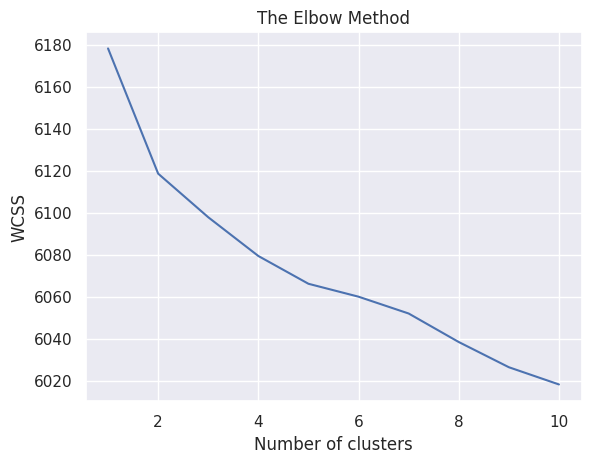

In [62]:
# Applying Elbow method to find optimal clusters
wcss = []
for i in range(1,11):
  kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
  kmeans.fit(X)
  wcss.append(kmeans.inertia_)
plt.plot(range(1,11), wcss)
plt.title("The Elbow Method")
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

The sum of square error keeps on decreasing on increasing the number of clusters. From this, still the optimal number of clusters are not clear, therefore we will use silhoutte analysis to find optimal number of clusters.

### Finding optimal clusters with 'Silhoutte Analysis'

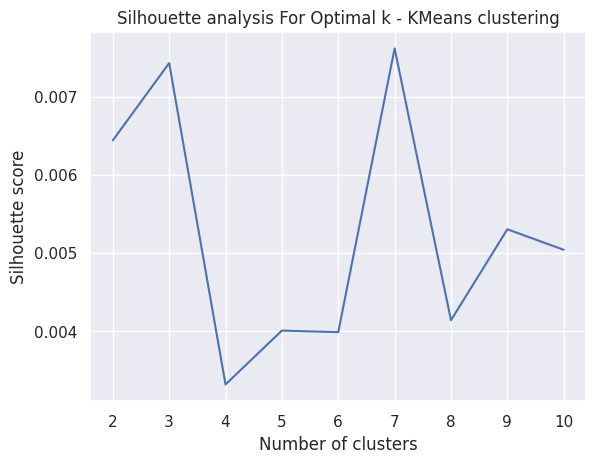

In [63]:
# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 11):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,11), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

We are getting the best silhoutte score for n=7 clusters, hence this is the final cluster number we're going to use.

In [64]:
#Clustering the data using 7 clusters
kmeans = KMeans(n_clusters=7, init='k-means++', random_state=42)
kmeans.fit(X)

KMeans(n_clusters=7, random_state=42)

In [65]:
# Evaluation Metric used : WCSS, Silhoutte Score
print(kmeans.inertia_, silhouette_score(X, kmeans.labels_))

6052.02083192825 0.007619202577020316


In [66]:
#Adding Cluster Label to the data
netflix_df['kmeans_cluster'] = kmeans.labels_
netflix_df.head()

,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,text_data,kmeans_cluster
0,s1,TV Show,3%,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gome rodol...,2
1,s2,Movie,7:19,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,demián bichir héctor bonilla oscar serrano aza...,3
2,s3,Movie,23:59,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",tedd chan stella chung henley hii lawrenc koh ...,1
3,s4,Movie,9,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",elijah wood john c reilli jennif connelli chri...,1
4,s5,Movie,21,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,jim sturgess kevin spacey kate bosworth aaron ...,4


Text(0.5, 1.0, 'Total content in each cluster ')

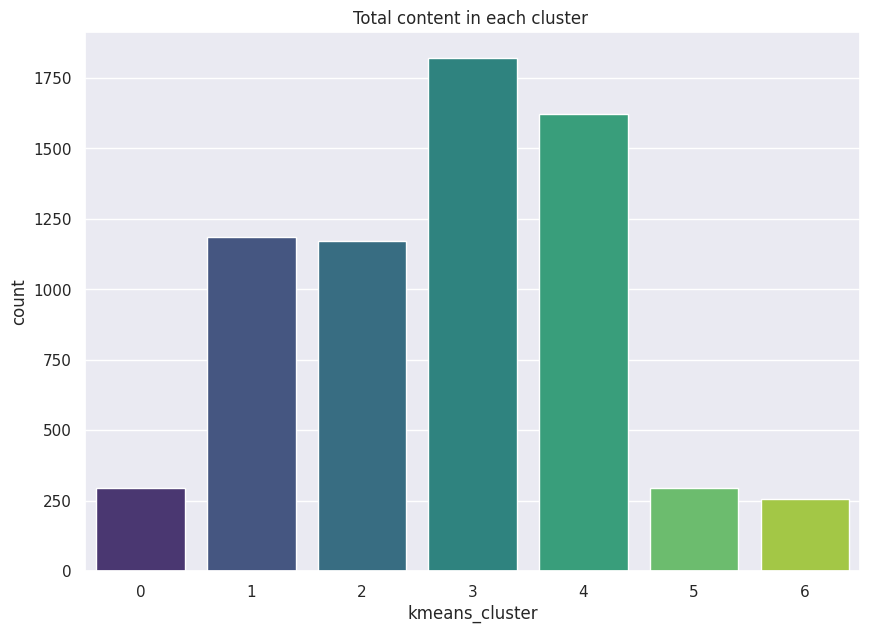

In [67]:
#Plotting total content in each cluster
plt.figure(figsize=(10,7))
sns.countplot(data=netflix_df, x='kmeans_cluster', palette='viridis')
plt.title('Total content in each cluster ')

Cluster 3 has the most number of content, while cluster 6 has the least

Text(0.5, 1.0, 'Total content in each cluster ')

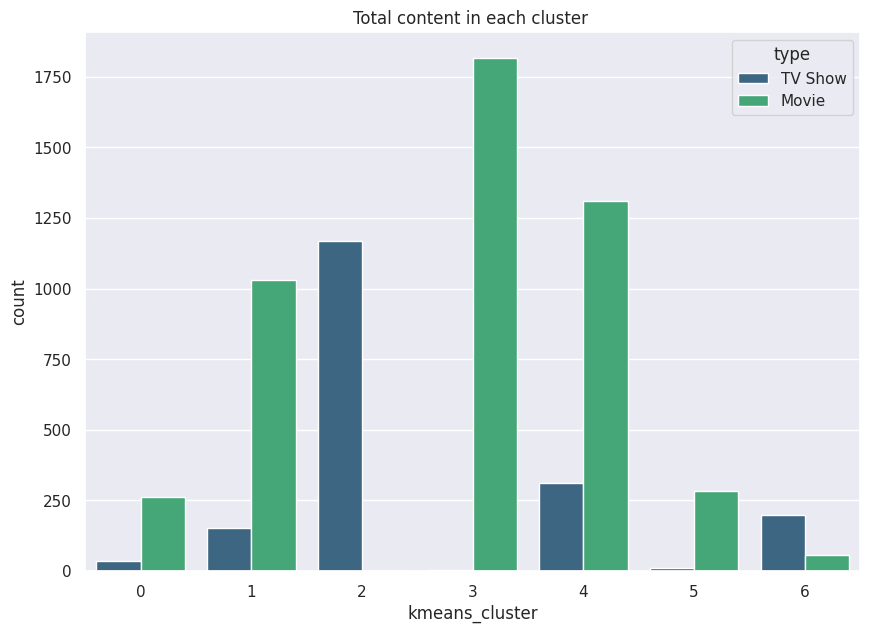

In [68]:
#Plotting number of movies and tv shows in each cluster
plt.figure(figsize=(10,7))
sns.countplot(data=netflix_df, x='kmeans_cluster', hue='type', palette='viridis')
plt.title('Total content in each cluster ')

Cluster 3 only consists of movies, while cluster 2 only consists of shows.

In [69]:
#Defining a function to build wordcloud for each cluster and columns
def get_wordcloud(cluster_num,column):
  netflix_wc = netflix_df[['kmeans_cluster',column]].dropna()
  netflix_wc = netflix_wc[netflix_wc['kmeans_cluster']==cluster_num]

  text = ' '.join(word for word in netflix_wc[column].tolist())
  wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white').generate(text)

  #Wordcloud
  plt.imshow(wordcloud,interpolation='bilinear')
  plt.axis('off')
  plt.show()

In [70]:
netflix_df.head(1)

,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,text_data,kmeans_cluster
0,s1,TV Show,3%,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gome rodol...,2


In [71]:
netflix_df[netflix_df['kmeans_cluster']==7]

,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,text_data,kmeans_cluster


Cluster 0


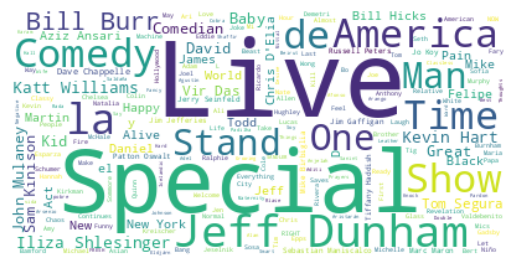

Cluster 1


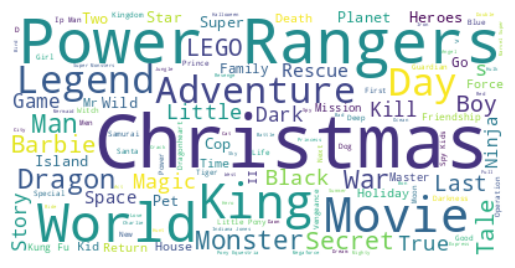

Cluster 2


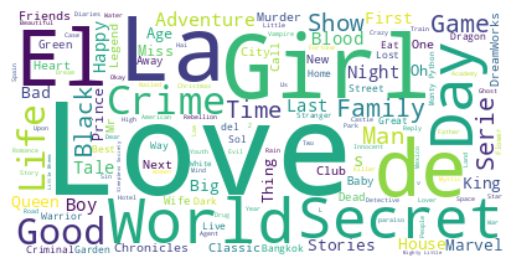

Cluster 3


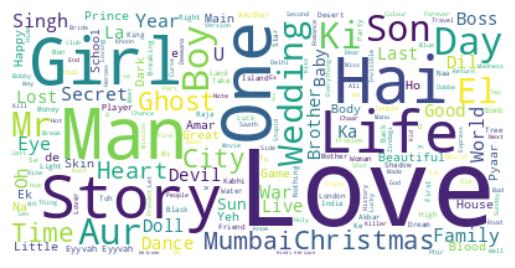

Cluster 4


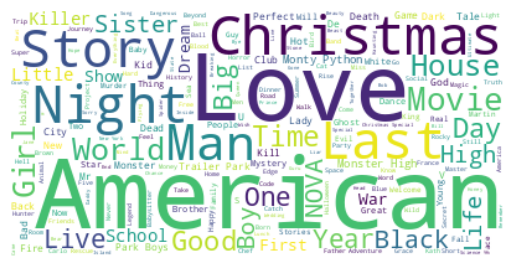

Cluster 5


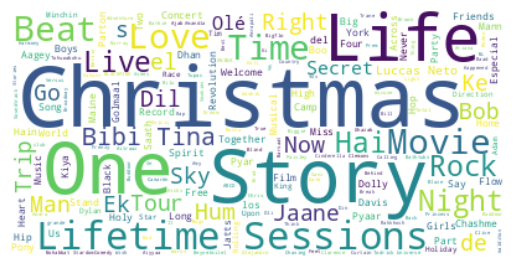

Cluster 6


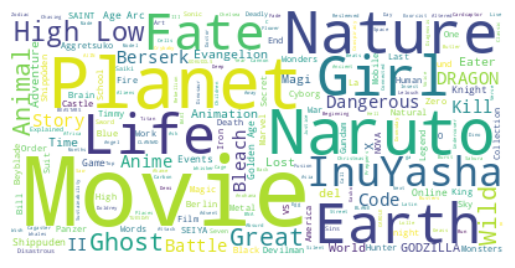

In [72]:
#Cluster Analysis for title columns
for i in range(0,7):
  print(f'Cluster {i}')
  get_wordcloud(i, 'title')

Cluster 0


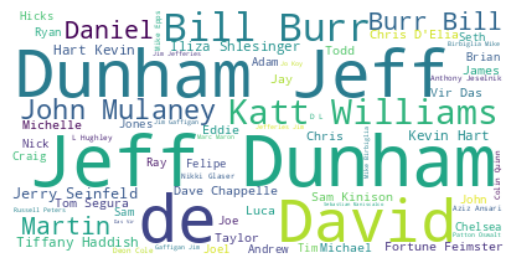

Cluster 1


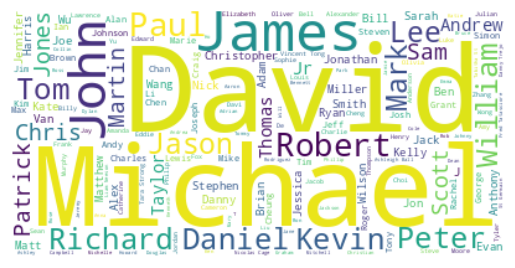

Cluster 2


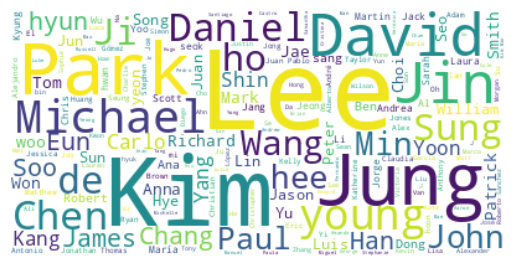

Cluster 3


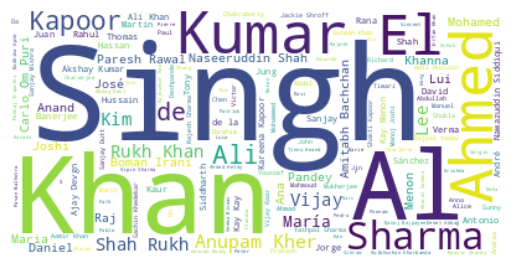

Cluster 4


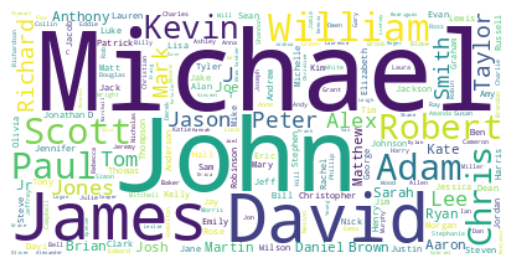

Cluster 5


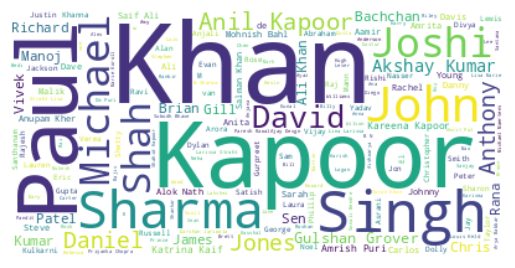

Cluster 6


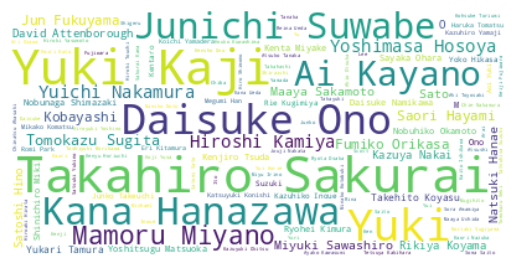

In [73]:
#Cluster Analysis for cast column
for i in range(0,7):
  print(f'Cluster {i}')
  get_wordcloud(i, 'cast')

Cluster 0


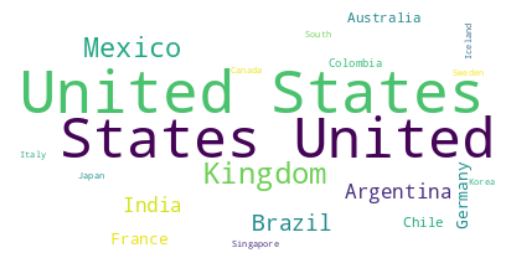

Cluster 1


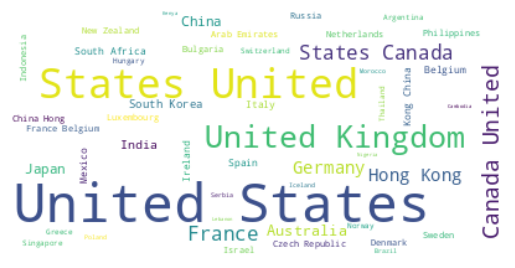

Cluster 2


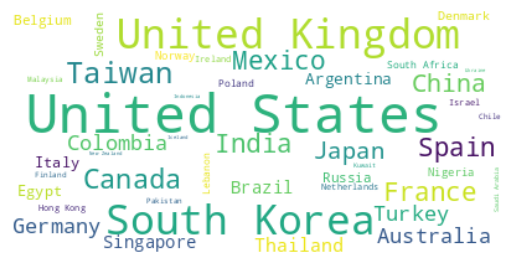

Cluster 3


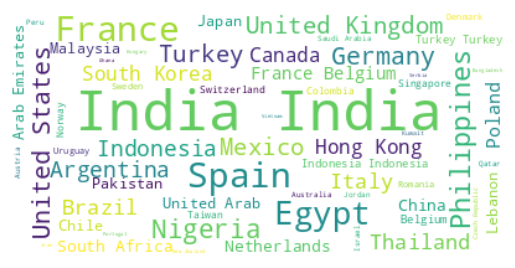

Cluster 4


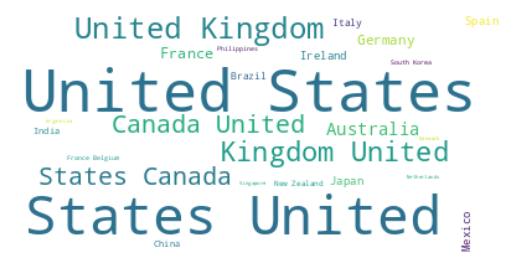

Cluster 5


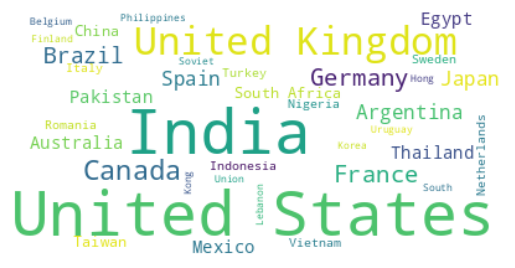

Cluster 6


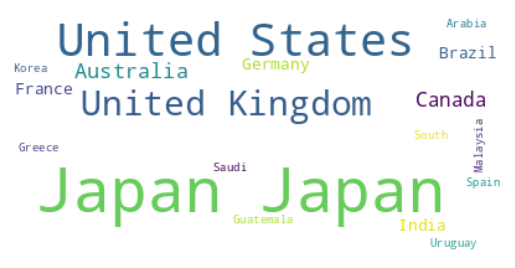

In [74]:
#Cluster Analysis for country column
for i in range(0,7):
  print(f'Cluster {i}')
  get_wordcloud(i, 'country')

Cluster 0


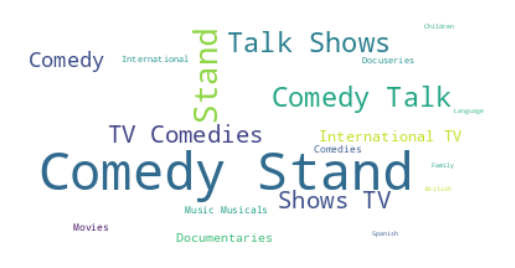

Cluster 1


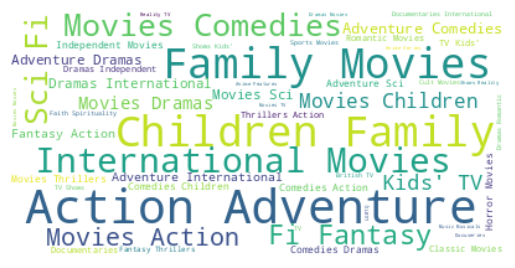

Cluster 2


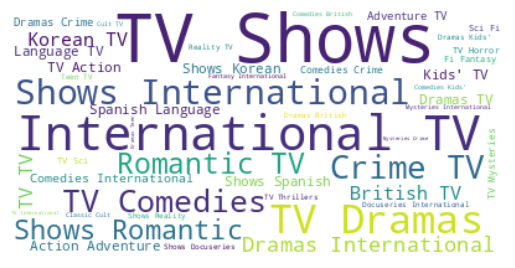

Cluster 3


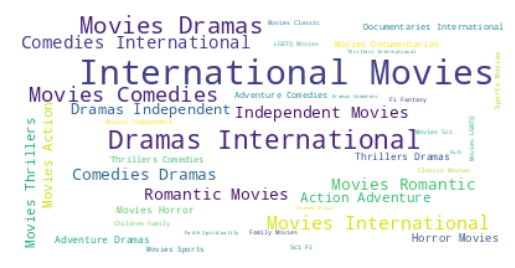

Cluster 4


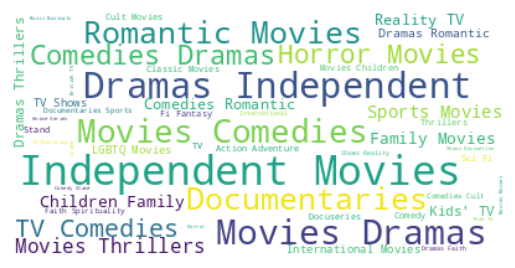

Cluster 5


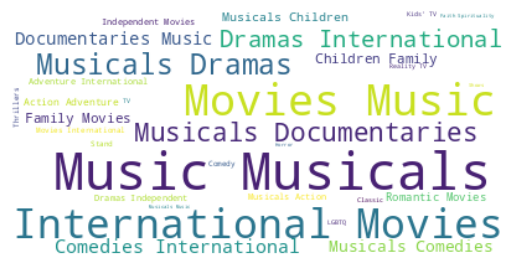

Cluster 6


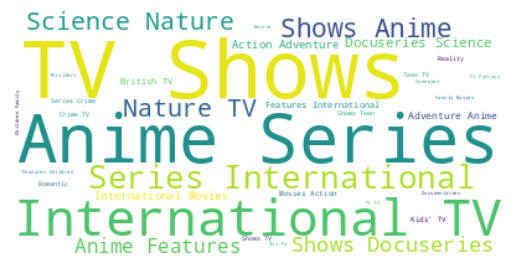

In [75]:
#Cluster Analysis for listed_in column
for i in range(0,7):
  print(f'Cluster {i}')
  get_wordcloud(i, 'listed_in')

Cluster 0


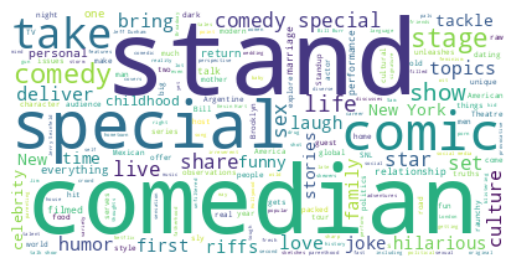

Cluster 1


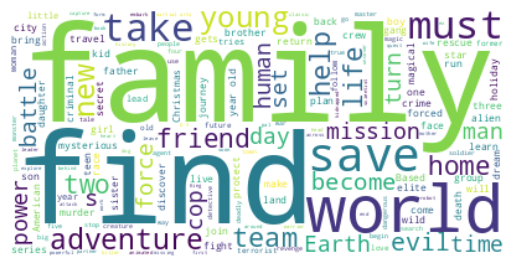

Cluster 2


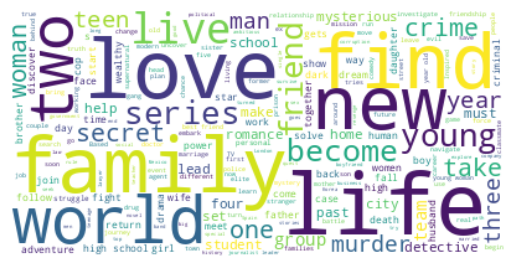

Cluster 3


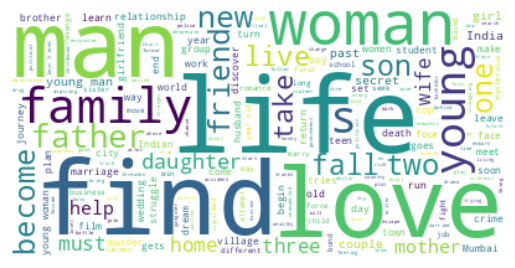

Cluster 4


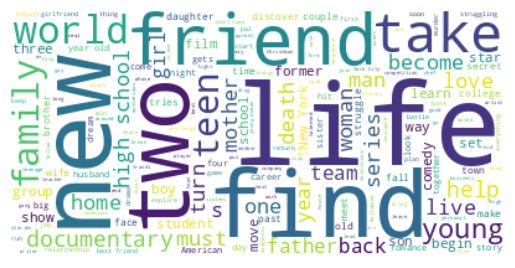

Cluster 5


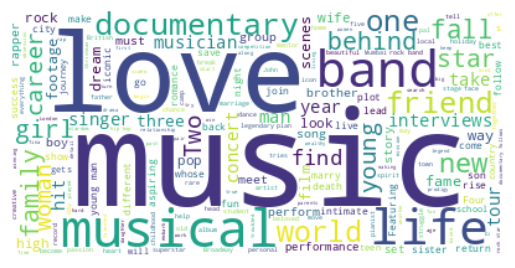

Cluster 6


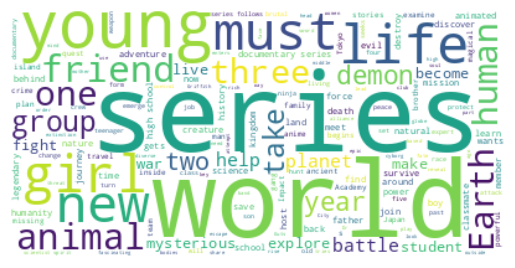

In [76]:
#Cluster Analysis for description column
for i in range(0,7):
  print(f'Cluster {i}')
  get_wordcloud(i, 'description')

#### Cluster Info

In [77]:
#Making a dataframe to display content in each cluster
cluster = [i for i in range(0,7)]
desc = ['Standup Comedy', 'Movies ', 'TV Shows','Indian Movies and Shows', 'Indie Movies/ Documentaries', 'Musical Movies and Documentaries', 'Anime Movies and Shows']
country = ['United States','United States', 'United States / United Kingdom/ South Korea', 'India','United States/ United Kingdom', 'United States/ India','Japan' ]
km_dict = {'Cluster':cluster, 'Content Description':desc, 'Country(s)':country}
km_df = pd.DataFrame(km_dict).set_index('Cluster')
km_df

,Content Description,Country(s)
Cluster,,
0,Standup Comedy,United States
1,Movies,United States
2,TV Shows,United States / United Kingdom/ South Korea
3,Indian Movies and Shows,India
4,Indie Movies/ Documentaries,United States/ United Kingdom
5,Musical Movies and Documentaries,United States/ India
6,Anime Movies and Shows,Japan


### 6.2 ML Model - Hierarchical clustering

####Building Dendograms to find optimal clusters

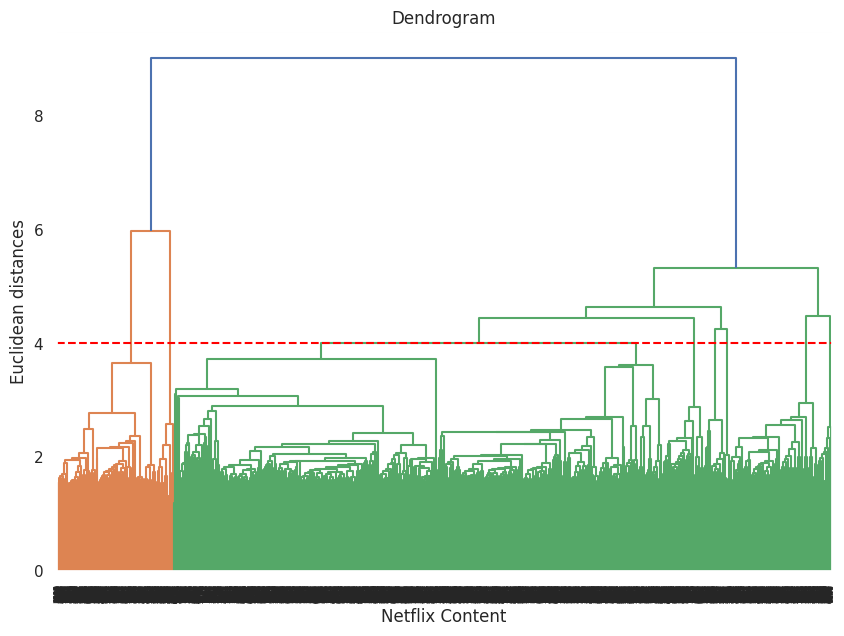

In [90]:
plt.figure(figsize=(10,7))
dendrogram = sch.dendrogram(sch.linkage(X , method = 'ward'),distance_sort='descending',
            show_leaf_counts=True)
plt.title('Dendrogram')
plt.xlabel('Netflix Content')
plt.ylabel('Euclidean distances')
plt.axhline(y=4, color='red', linestyle='--')
plt.show()

Optimal number of clusters from the dendogram above is n=8

In [79]:
#Applying agglormerative clustering with optimal cluster n = 8
hc = AgglomerativeClustering(n_clusters=8, affinity='euclidean', linkage='ward')
hc.fit_predict(X)

netflix_df['hierarchical_cluster'] = hc.labels_
netflix_df.head()

,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,text_data,kmeans_cluster,hierarchical_cluster
0,s1,TV Show,3%,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gome rodol...,2,1
1,s2,Movie,7:19,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,demián bichir héctor bonilla oscar serrano aza...,3,0
2,s3,Movie,23:59,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",tedd chan stella chung henley hii lawrenc koh ...,1,0
3,s4,Movie,9,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",elijah wood john c reilli jennif connelli chri...,1,0
4,s5,Movie,21,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,jim sturgess kevin spacey kate bosworth aaron ...,4,0


Text(0.5, 1.0, 'Total content in each cluster ')

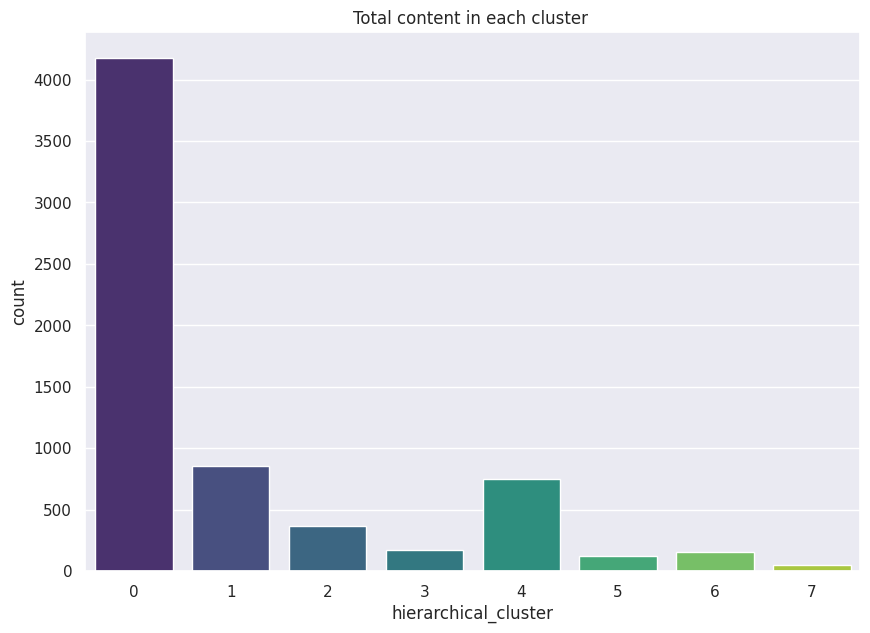

In [80]:
#Plotting total content in each cluster
plt.figure(figsize=(10,7))
sns.countplot(data=netflix_df, x='hierarchical_cluster', palette='viridis')
plt.title('Total content in each cluster ')

Total content is max is cluster 0 and least in cluster 7

Text(0.5, 1.0, 'Number of movies and shows in each cluster ')

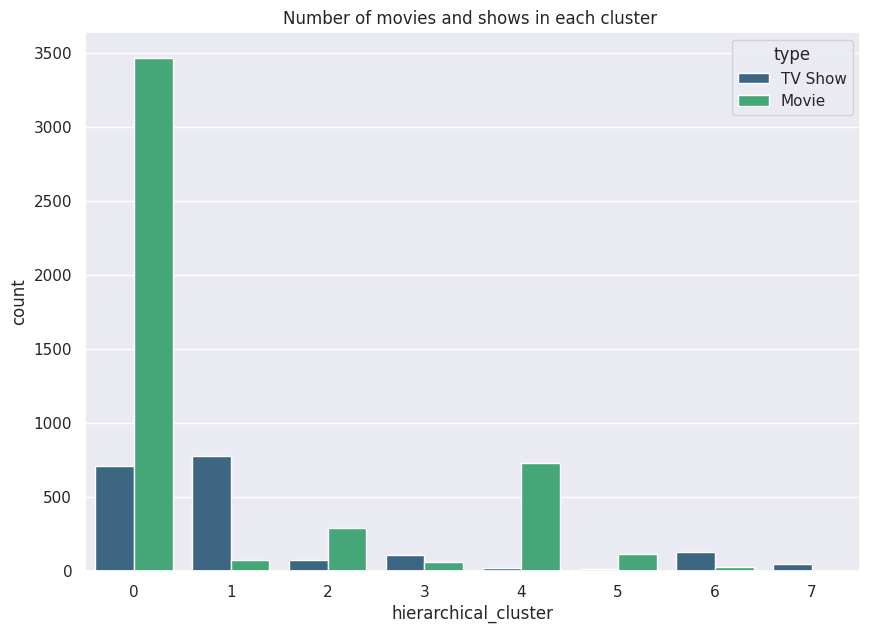

In [81]:
#Plotting number of movies and shows each cluster
plt.figure(figsize=(10,7))
sns.countplot(data=netflix_df, x='hierarchical_cluster', hue='type', palette='viridis')
plt.title('Number of movies and shows in each cluster ')

Number of movies is max in cluster 0, number of shows are max in cluster 1

In [82]:
#Defining a function to create wordcloud for each cluster and columns
def get_wordcloud(cluster_num,column):
  netflix_wc = netflix_df[['hierarchical_cluster',column]].dropna()
  netflix_wc = netflix_wc[netflix_wc['hierarchical_cluster']==cluster_num]

  text = ' '.join(word for word in netflix_wc[column].tolist())
  wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white').generate(text)

  #Wordcloud
  plt.imshow(wordcloud,interpolation='bilinear')
  plt.axis('off')
  plt.show()

Cluster 0


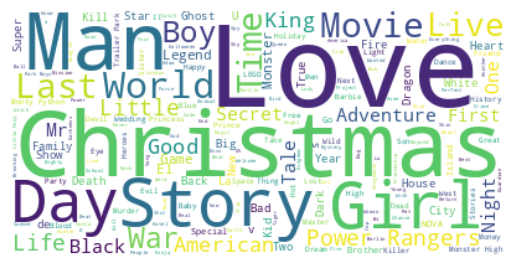

Cluster 1


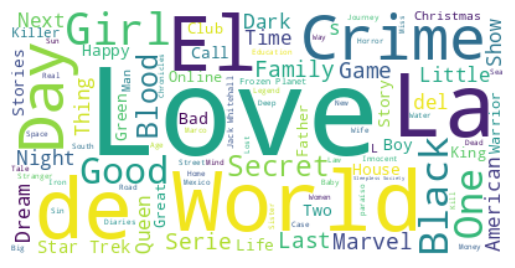

Cluster 2


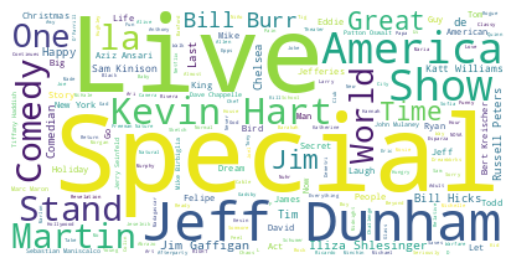

Cluster 3


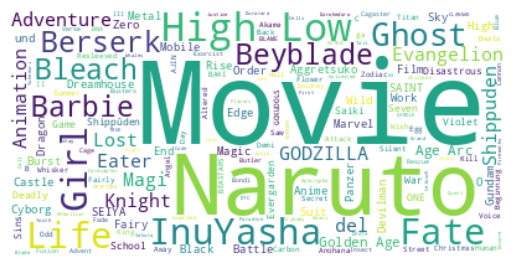

Cluster 4


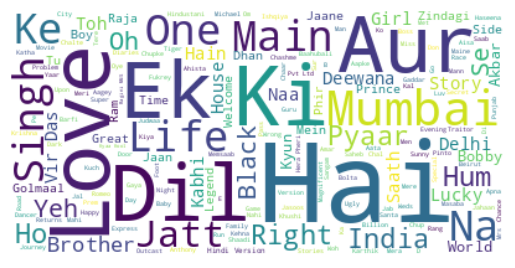

Cluster 5


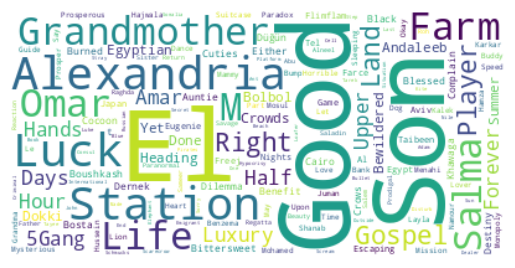

Cluster 6


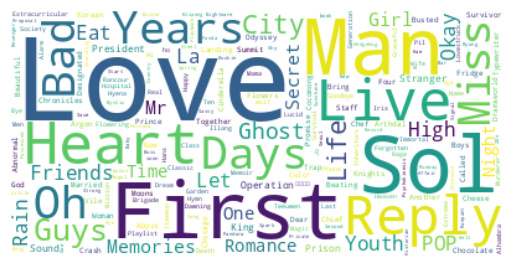

Cluster 7


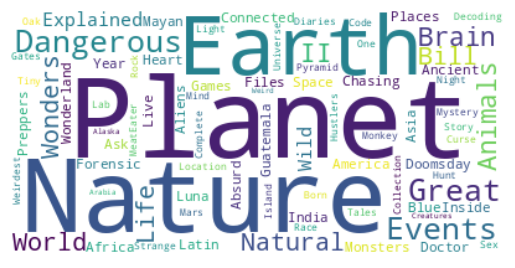

In [83]:
#Cluster Analysis for title column
for i in range(0,8):
  print(f'Cluster {i}')
  get_wordcloud(i, 'title')

Cluster 0


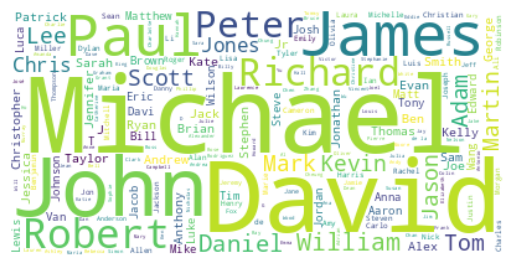

Cluster 1


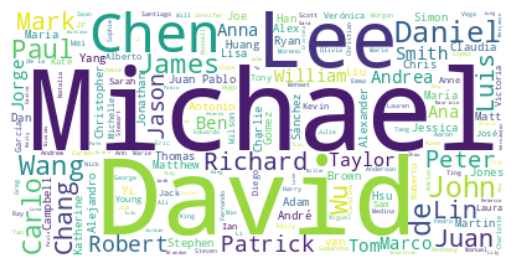

Cluster 2


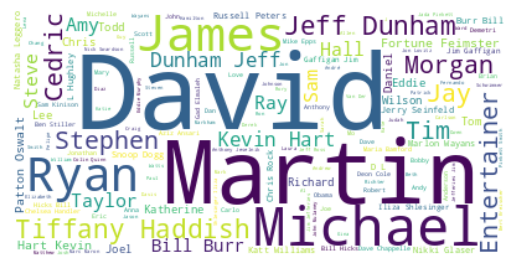

Cluster 3


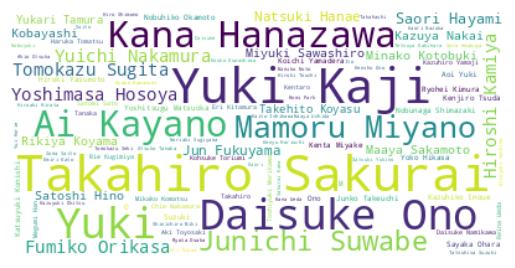

Cluster 4


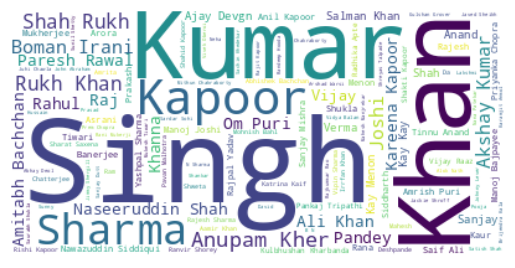

Cluster 5


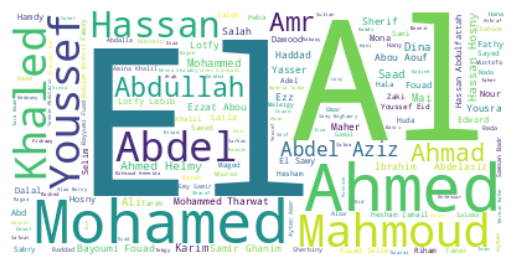

Cluster 6


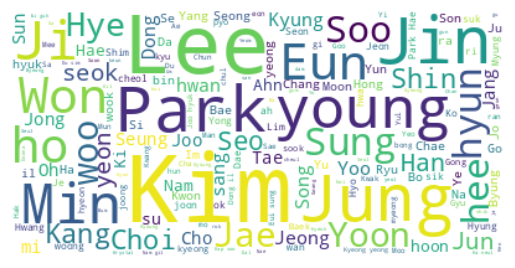

Cluster 7


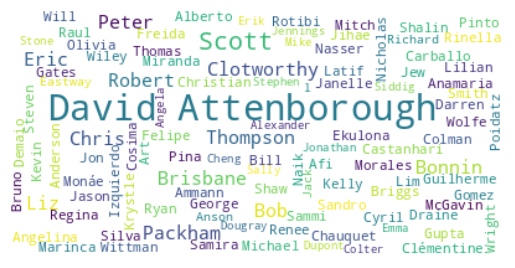

In [84]:
#Cluster Analysis for cast column
for i in range(0,8):
  print(f'Cluster {i}')
  get_wordcloud(i, 'cast')

Cluster 0


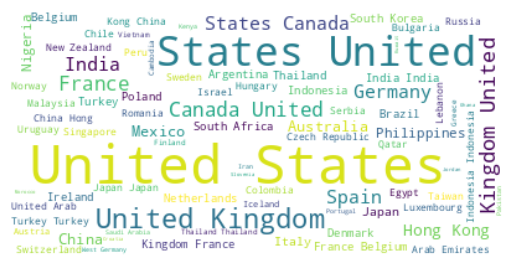

Cluster 1


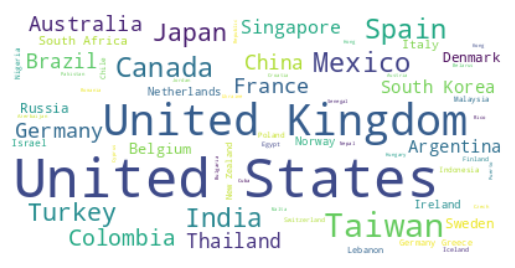

Cluster 2


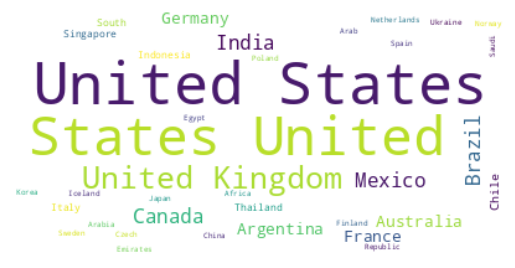

Cluster 3


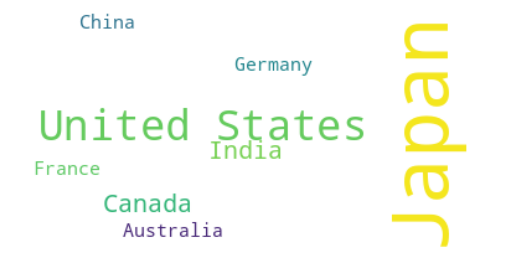

Cluster 4


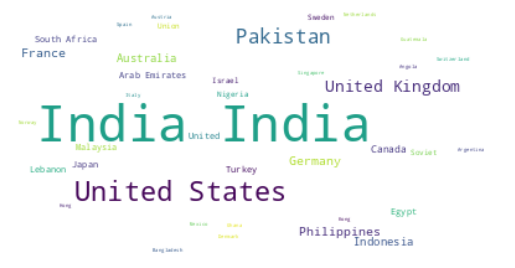

Cluster 5


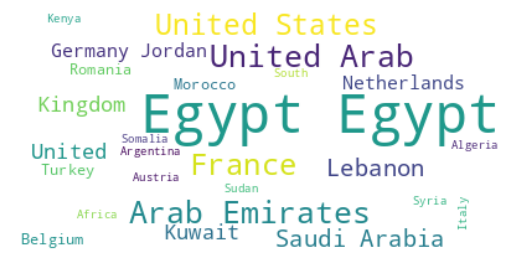

Cluster 6


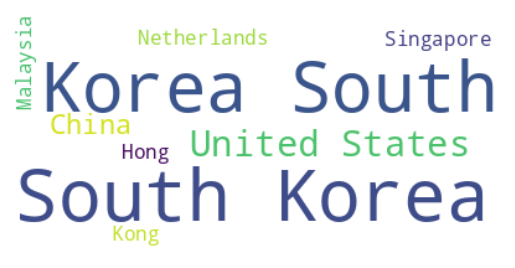

Cluster 7


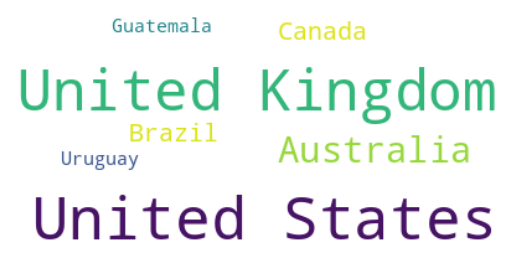

In [85]:
#Cluster Analysis for country column
for i in range(0,8):
  print(f'Cluster {i}')
  get_wordcloud(i, 'country')

Cluster 0


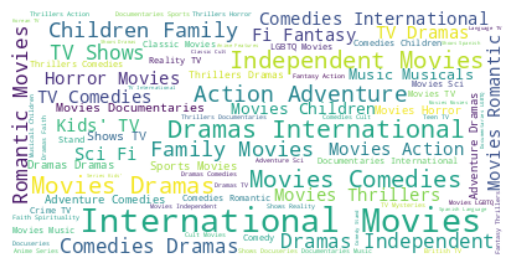

Cluster 1


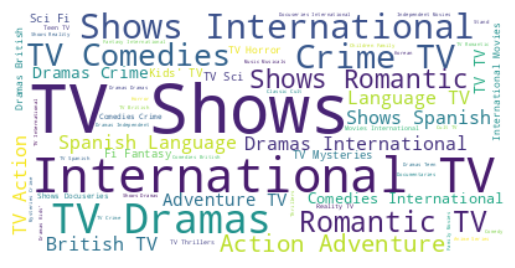

Cluster 2


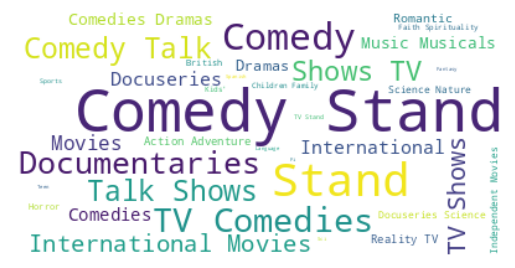

Cluster 3


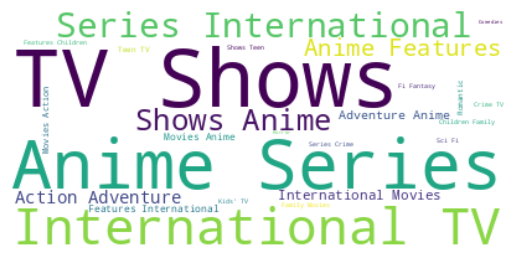

Cluster 4


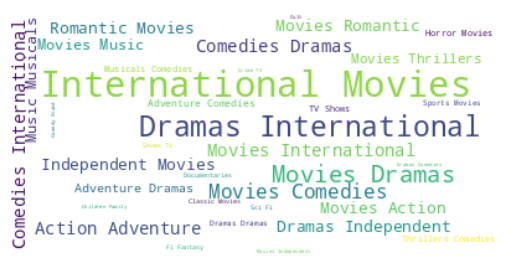

Cluster 5


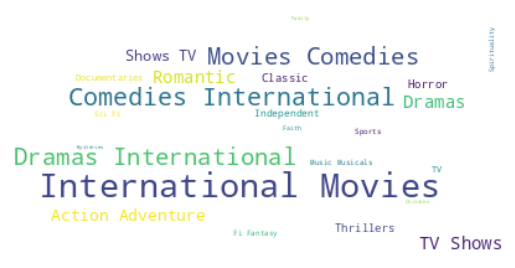

Cluster 6


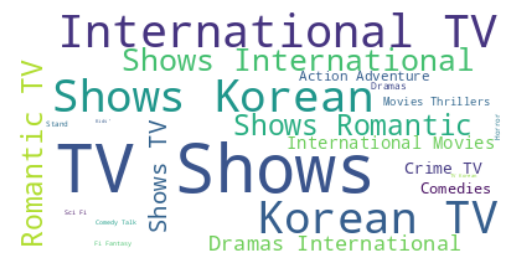

Cluster 7


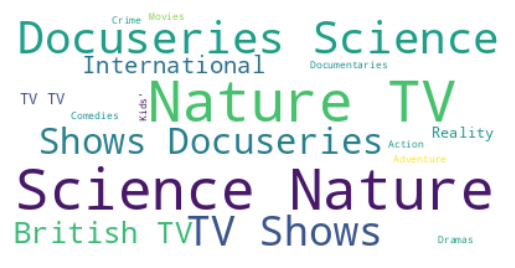

In [86]:
#Cluster Analysis for listed_in column
for i in range(0,8):
  print(f'Cluster {i}')
  get_wordcloud(i, 'listed_in')

Cluster 0


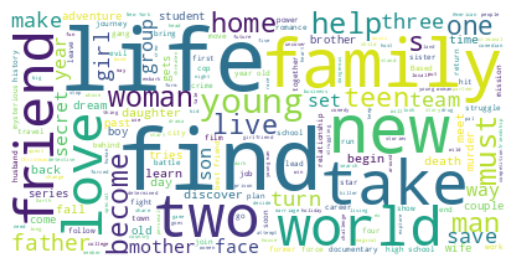

Cluster 1


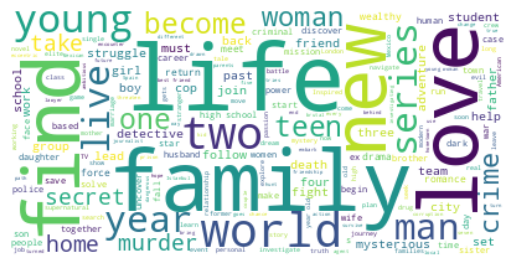

Cluster 2


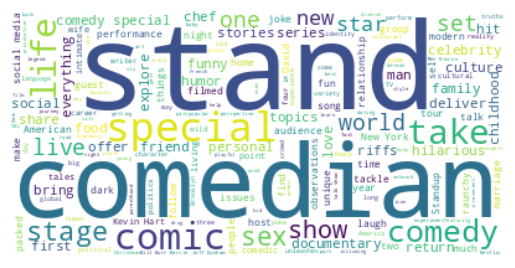

Cluster 3


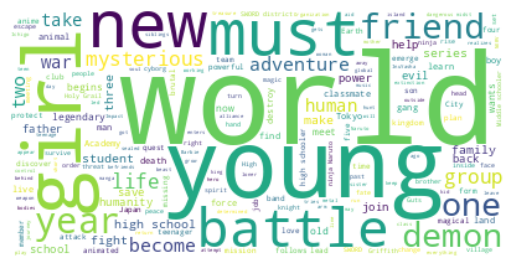

Cluster 4


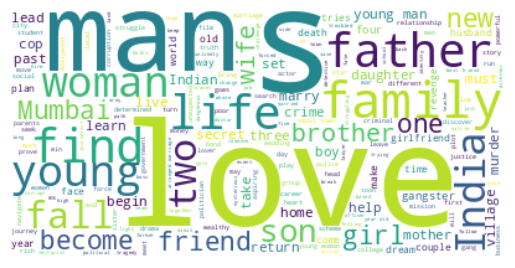

Cluster 5


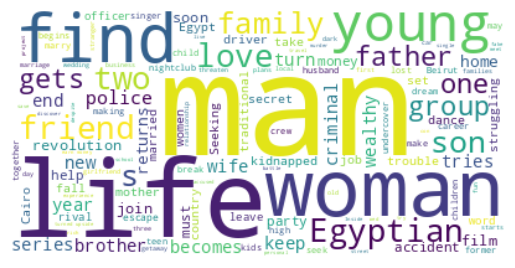

Cluster 6


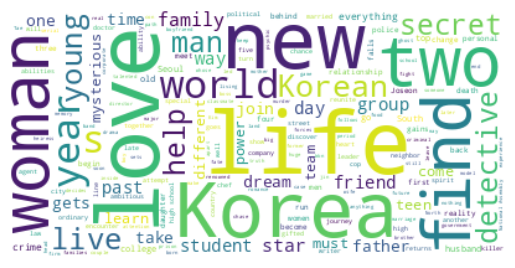

Cluster 7


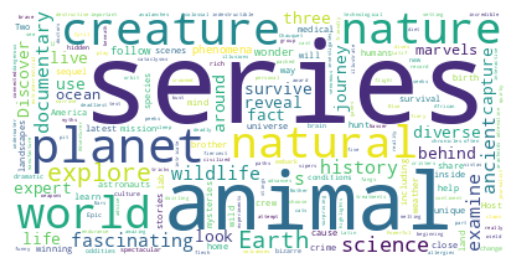

In [87]:
#Cluster Analysis for description column
for i in range(0,8):
  print(f'Cluster {i}')
  get_wordcloud(i, 'description')

#### Cluster Info

In [88]:
#Making a dataframe to display content in each cluster
cluster = [i for i in range(0,8)]
desc = ['English Movies', 'English TV Shows', 'Standup Comedy','Anime Movies and Shows', 'Indian Movies and Shows', 'Arabic Movies', 'Korean TV Shows (K-Drama)', 'Nature and Science Documentaries']
country = ['United States','United States/ United Kingdom', 'United States', 'Japan','India','Egypt/UAE/Saudi Arabia', 'South Korea','United Kingdom/United States' ]
hc_dict = {'Cluster':cluster, 'Content Description':desc, 'Country(s)':country}
hc_df = pd.DataFrame(hc_dict).set_index('Cluster')
hc_df

,Content Description,Country(s)
Cluster,,
0,English Movies,United States
1,English TV Shows,United States/ United Kingdom
2,Standup Comedy,United States
3,Anime Movies and Shows,Japan
4,Indian Movies and Shows,India
5,Arabic Movies,Egypt/UAE/Saudi Arabia
6,Korean TV Shows (K-Drama),South Korea
7,Nature and Science Documentaries,United Kingdom/United States


## Final Model

- After performing both K-Means and Hierarchical Clustering, We have created tables consisting of a general idea of what type of content is present in each cluster.
- After analysing both type of clustering, the hierarchical clustering model will be the final model of choice because of higher number of cluster (n=8) and better seperation of content on Netflix.

# **Conclusion**

- In this project, we tackled a dataset consisting of movies and tv shows on Netflix. We performed text based clustering on this dataset to group similar content together in one cluster.
- We began, by peforming EDA on the dataset, where we found insights like:
  - There are more movies than tv shows on netflix
  - The total content on netflix has increased exponentially in the last 15 years. Netflix has been increasing its focus on TV shows rather than movies, as most of its original content are shows.
  - United States is the country with most content on Netflix, while India has the most number of movies on Netflix
  - Most of the content target audience is 18+.

- After this, we did feature engineering, which included making our text-based feature for clustering. For this we chose columns: cast, country, rating, listed_in and description.
- Textual preprocessing involved removing punctuations and stopwords, text-vectorization using TF-IDF vectorizer, making 5000 features.
- Dimensionality reduction was done using Principal Component Analysis, where 3000 came out to be the best number of features explaining 80% of the variance.
- We used two models for clustering: K-Means clustering and Hierarchical clustering
  - In K-Means, optimal number of clusters were found by using Elbow Method and Silhouette Analysis, and number of clusters taken was '7'.
  - In Hierarchical clustering, the optimal clusters came out to be '8' by using dendogram and Agglomerative clustering was used to cluster the data.

- Finally, Hierarchical Clustering gave us the best result, as these clusters were able to differentiate and group similar content better.


#### Future Scope

- A recommendation system can be build for recommending movies and shows based on what one is currently watching.